#Importing libraries

In [ ]:
!pip install pandas_ta
!pip install tabulate


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import random
import missingno as msno
from tabulate import tabulate
import scipy.stats as st
import matplotlib.patches as mpl_patches
import warnings
warnings.filterwarnings("ignore")
from scipy.stats import describe
import matplotlib.cm as cm
import matplotlib.lines as mlines
from pandas.core.window.rolling import Rolling
import pandas_ta as ta
import time
import math

from datetime import date
from tqdm import tqdm_notebook
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error


from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import RobustScaler,MinMaxScaler,PowerTransformer,StandardScaler

from sklearn.feature_selection import RFECV
from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import LinearRegression

#To handle MultiOutputRegressor
from sklearn.multioutput import MultiOutputRegressor

#Read CSV File

In [ ]:
final_df = pd.read_csv('/content/dataset_mean_Hessen_stations_selected.csv')
final_df

,Date,Time,station_uuid,Diesel,E5,E10,WTI_price,SaP500_Open,SaP500_High,SaP500_Low,SaP500_Close,Brent_Price,DAX_Volume,E5_mean,E10_mean,Diesel_mean
0,2014-06-09,0,0a462dbb-b1ea-4489-a72d-0b1bf2ac7689,1.469,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.628269,1.589088,1.419305
1,2014-06-09,1,0a462dbb-b1ea-4489-a72d-0b1bf2ac7689,1.469,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.601752,1.564805,1.389906
2,2014-06-09,2,0a462dbb-b1ea-4489-a72d-0b1bf2ac7689,1.469,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.596050,1.556050,1.384243
3,2014-06-09,3,0a462dbb-b1ea-4489-a72d-0b1bf2ac7689,1.469,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.587817,1.547506,1.376842
4,2014-06-09,4,0a462dbb-b1ea-4489-a72d-0b1bf2ac7689,1.469,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.588743,1.548762,1.378618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
750475,2022-12-30,19,e8f17c2f-153c-4c0c-a0d6-086bbe50a718,1.809,1.752333,1.692333,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.750966,1.692774,1.806778
750476,2022-12-30,20,e8f17c2f-153c-4c0c-a0d6-086bbe50a718,1.781,1.733000,1.673000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.733389,1.675177,1.787536
750477,2022-12-30,21,e8f17c2f-153c-4c0c-a0d6-086bbe50a718,1.769,1.729000,1.669000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.721396,1.664292,1.780922
750478,2022-12-30,22,e8f17c2f-153c-4c0c-a0d6-086bbe50a718,1.809,1.769000,1.709000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.778199,1.720781,1.829777


In [ ]:
final_df = final_df[final_df['station_uuid'] == 'aa998956-685e-4bc5-a734-2ab826efb511']
final_df = final_df.reset_index(drop = True)
final_df

,Date,Time,station_uuid,Diesel,E5,E10,WTI_price,SaP500_Open,SaP500_High,SaP500_Low,SaP500_Close,Brent_Price,DAX_Volume,E5_mean,E10_mean,Diesel_mean
0,2014-06-09,0,aa998956-685e-4bc5-a734-2ab826efb511,1.469000,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.628269,1.589088,1.419305
1,2014-06-09,1,aa998956-685e-4bc5-a734-2ab826efb511,1.469000,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.601752,1.564805,1.389906
2,2014-06-09,2,aa998956-685e-4bc5-a734-2ab826efb511,1.399000,1.619000,1.579000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.596050,1.556050,1.384243
3,2014-06-09,3,aa998956-685e-4bc5-a734-2ab826efb511,1.369000,1.589000,1.549000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.587817,1.547506,1.376842
4,2014-06-09,4,aa998956-685e-4bc5-a734-2ab826efb511,1.369000,1.589000,1.549000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.588743,1.548762,1.378618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75043,2022-12-30,19,aa998956-685e-4bc5-a734-2ab826efb511,1.782333,1.732333,1.672333,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.750966,1.692774,1.806778
75044,2022-12-30,20,aa998956-685e-4bc5-a734-2ab826efb511,1.782333,1.729000,1.669000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.733389,1.675177,1.787536
75045,2022-12-30,21,aa998956-685e-4bc5-a734-2ab826efb511,1.782333,1.729000,1.669000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.721396,1.664292,1.780922
75046,2022-12-30,22,aa998956-685e-4bc5-a734-2ab826efb511,1.779000,1.739000,1.679000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.778199,1.720781,1.829777


#Feature Engineering

Creating lag features

In [ ]:
Time_mapping = {0: '00:00', 1: '01:00', 2: '02:00', 3: '03:00', 4: '04:00', 5: '05:00', 6: '06:00', 7: '07:00', 8: '08:00', 9: '09:00', 10: '10:00', 11: '11:00', 12: '12:00', 13: '13:00', 14: '14:00', 15: '15:00', 16: '16:00', 17: '17:00', 18: '18:00', 19: '19:00', 20: '20:00', 21: '21:00', 22: '22:00', 23: '23:00'}
final_df['Date'] = pd.to_datetime(final_df['Date'].astype(str) + ' ' + final_df['Time'].map(Time_mapping), format='%Y-%m-%d %H:%M')

final_df = final_df.drop(['Time','station_uuid'], axis = 1)

# Shift the target variables to create lag features
final_df['E5_lag_1'] = final_df['E5'].shift(24)
final_df['E5_lag_2'] = final_df['E5'].shift(48)
final_df['E5_lag_3'] = final_df['E5'].shift(72)
final_df['E5_lag_7'] = final_df['E5'].shift(168)
final_df['E5_lag_14'] = final_df['E5'].shift(336)
final_df['E5_lag_21'] = final_df['E5'].shift(504)
final_df['E5_lag_30'] = final_df['E5'].shift(720)

final_df['E10_lag_1'] = final_df['E10'].shift(24)
final_df['E10_lag_2'] = final_df['E10'].shift(48)
final_df['E10_lag_3'] = final_df['E10'].shift(72)
final_df['E10_lag_7'] = final_df['E10'].shift(168)
final_df['E10_lag_14'] = final_df['E10'].shift(336)
final_df['E10_lag_21'] = final_df['E10'].shift(504)
final_df['E10_lag_30'] = final_df['E10'].shift(720)

final_df['Diesel_lag_1'] = final_df['Diesel'].shift(24)
final_df['Diesel_lag_2'] = final_df['Diesel'].shift(48)
final_df['Diesel_lag_3'] = final_df['Diesel'].shift(72)
final_df['Diesel_lag_7'] = final_df['Diesel'].shift(168)
final_df['Diesel_lag_14'] = final_df['Diesel'].shift(336)
final_df['Diesel_lag_21'] = final_df['Diesel'].shift(504)
final_df['Diesel_lag_30'] = final_df['Diesel'].shift(720)

final_df

,Date,Diesel,E5,E10,WTI_price,SaP500_Open,SaP500_High,SaP500_Low,SaP500_Close,Brent_Price,...,E10_lag_14,E10_lag_21,E10_lag_30,Diesel_lag_1,Diesel_lag_2,Diesel_lag_3,Diesel_lag_7,Diesel_lag_14,Diesel_lag_21,Diesel_lag_30
0,2014-06-09 00:00:00,1.469000,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-06-09 01:00:00,1.469000,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-06-09 02:00:00,1.399000,1.619000,1.579000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-06-09 03:00:00,1.369000,1.589000,1.549000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-06-09 04:00:00,1.369000,1.589000,1.549000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75043,2022-12-30 19:00:00,1.782333,1.732333,1.672333,80.16,3828.85,3839.85,3800.34,3839.50,82.82,...,1.6365,1.609,1.675667,1.792333,1.801500,1.776500,1.772333,1.819,1.734,1.792333
75044,2022-12-30 20:00:00,1.782333,1.729000,1.669000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,...,1.6390,1.584,1.674000,1.792333,1.805667,1.785667,1.774000,1.809,1.709,1.784000
75045,2022-12-30 21:00:00,1.782333,1.729000,1.669000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,...,1.6190,1.579,1.674000,1.779000,1.805667,1.759000,1.774000,1.809,1.709,1.784000
75046,2022-12-30 22:00:00,1.779000,1.739000,1.679000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,...,1.6590,1.619,1.689000,1.819000,1.829000,1.799000,1.799000,1.849,1.749,1.809000


In [ ]:
def feature_smoothening(df,feature_name,smoothening_type,smoothening_range=[7,30,90],show_plot=False,show_original_Feature_in_plot=True):
    if smoothening_type == 'sma':
        for j in smoothening_range:
            df[f'{smoothening_type}{j} {feature_name}'] = ta.sma(df[feature_name],j)

    elif smoothening_type == 'var':
        for j in smoothening_range:
            df[f'{smoothening_type}{j} {feature_name}'] = ta.variance(df[feature_name],j)

    elif smoothening_type == 'stdev':
        for j in smoothening_range:
            df[f'{smoothening_type}{j} {feature_name}'] = ta.stdev(df[feature_name],j)

    elif smoothening_type == 'ema':
        for j in smoothening_range:
            df[f'{smoothening_type}{j} {feature_name}'] = ta.ema(df[feature_name],j)

    elif smoothening_type == 'wma':
        for j in smoothening_range:
            df[f'{smoothening_type}{j} {feature_name}'] = ta.wma(df[feature_name],j)

    elif smoothening_type == 'rsi':
        for j in smoothening_range:
             df[f'{smoothening_type}{j} {feature_name}'] = ta.rsi(df[feature_name],j)

    elif smoothening_type == 'roc':
        for j in smoothening_range:
            df[f'{smoothening_type}{j} {feature_name}'] = ta.roc(df[feature_name],j)

    elif smoothening_type == 'dema':
        for j in smoothening_range:
            df[f'{smoothening_type}{j} {feature_name}'] = ta.dema(df[feature_name],j)

    elif smoothening_type == 'tema':
        for j in smoothening_range:
            df[f'{smoothening_type}{j} {feature_name}'] = ta.tema(df[feature_name],j)

    elif smoothening_type == 'bband_lower':
        for j in smoothening_range:
            bband_df = ta.bbands(df[feature_name],j)
            df[f'{smoothening_type}{j} {feature_name}'] = bband_df[f'BBL_{j}_2.0']

    elif smoothening_type == 'bband_upper':
        for j in smoothening_range:
            bband_df = ta.bbands(df[feature_name],j)
            df[f'{smoothening_type}{j} {feature_name}'] = bband_df[f'BBU_{j}_2.0']

    elif smoothening_type == 'macd':
        macd_df = ta.macd(df[feature_name])
        df[f'{smoothening_type} hist {feature_name}'] = macd_df['MACDh_12_26_9']
        df[f'{smoothening_type} signal {feature_name}'] = macd_df['MACDs_12_26_9']
        df[f'{smoothening_type} {feature_name}'] = macd_df['MACD_12_26_9']


    if show_plot == True and show_original_Feature_in_plot==True :
        df[[feature_name]+[i for i in list(df.columns) if i.split(" ")[-1] == feature_name and i.split(" ")[0][0:len(smoothening_type)] == smoothening_type]].plot(kind='line',figsize=(25,5))
        plt.grid()
        plt.title(f'Feature Smoothening-{feature_name} by {smoothening_type}')
        plt.xticks([])
        plt.show()

    elif show_plot == True and show_original_Feature_in_plot==False :
        df[[i for i in list(df.columns) if i.split(" ")[-1] == feature_name and i.split(" ")[0][0:len(smoothening_type)] == smoothening_type]].plot(kind='line',figsize=(25,5))
        plt.grid()
        plt.title(f'Feature Smoothening-{feature_name} by {smoothening_type}')
        plt.xticks([])
        plt.show()

In [ ]:
feature_list = [i for i in list(final_df.columns) if i not in ['Date','E5','E10','Diesel','E5_lag_1','E5_lag_2','E5_lag_3','E10_lag_1','E10_lag_2','E10_lag_3','Diesel_lag_1','Diesel_lag_2','Diesel_lag_3', 'E5_mean', 'E10_mean', 'Diesel_mean', 'E5_lag_7', 'E5_lag_14', 'E5_lag_21', 'E5_lag_30', 'E10_lag_7', 'E10_lag_14', 'E10_lag_21', 'E10_lag_30', 'Diesel_lag_7', 'Diesel_lag_14', 'Diesel_lag_21', 'Diesel_lag_30']]
print (feature_list)

['WTI_price', 'SaP500_Open', 'SaP500_High', 'SaP500_Low', 'SaP500_Close', 'Brent_Price', 'DAX_Volume']


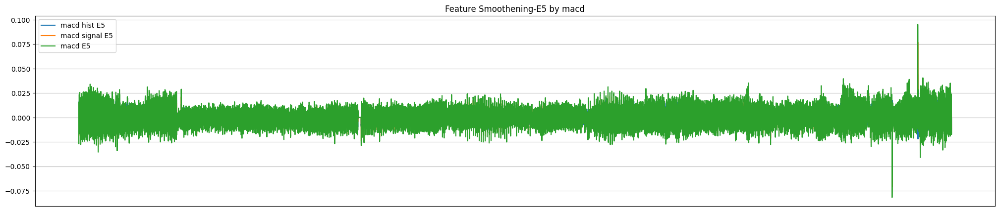

In [ ]:
feature_smoothening(final_df,'E5','macd',show_plot=True,show_original_Feature_in_plot=False)

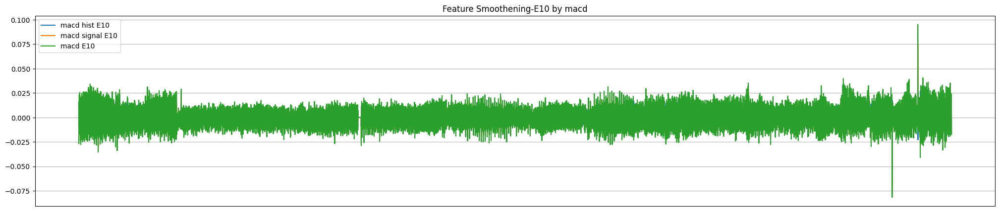

In [ ]:
feature_smoothening(final_df,'E10','macd',show_plot=True,show_original_Feature_in_plot=False)

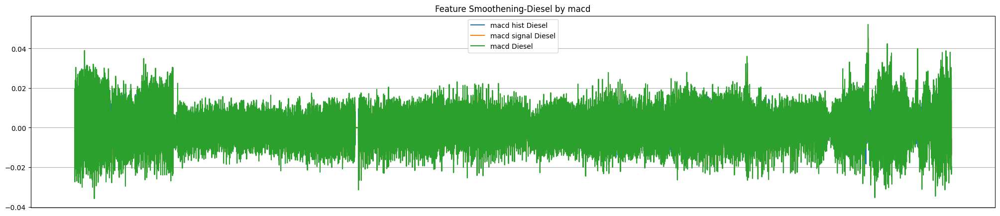

In [ ]:
feature_smoothening(final_df,'Diesel','macd',show_plot=True,show_original_Feature_in_plot=False)

Simple Moving Average

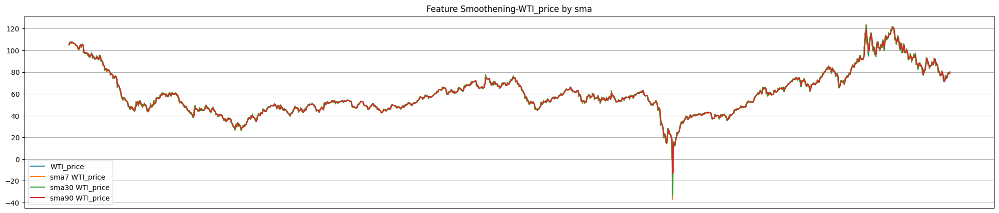

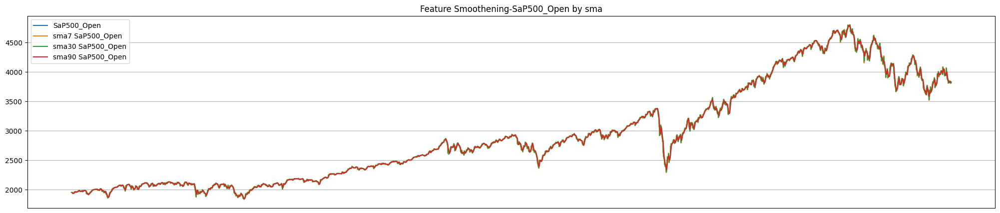

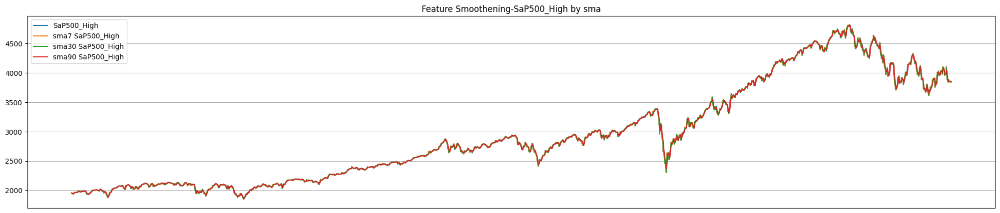

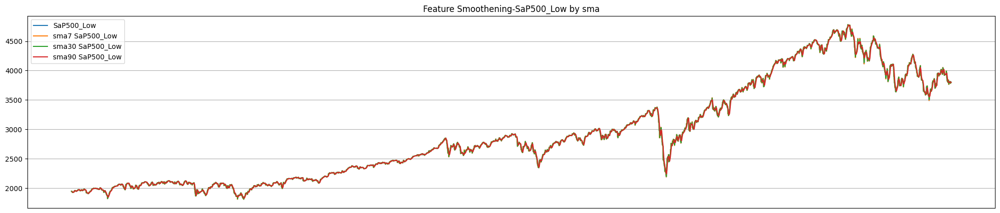

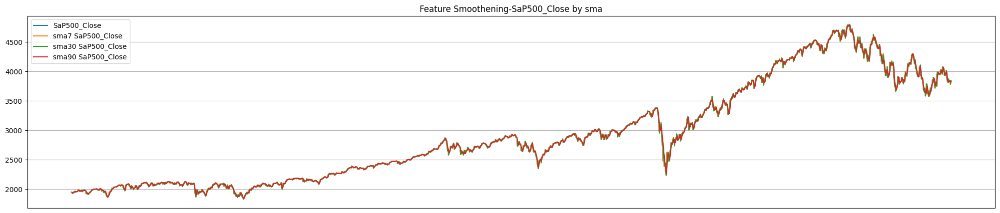

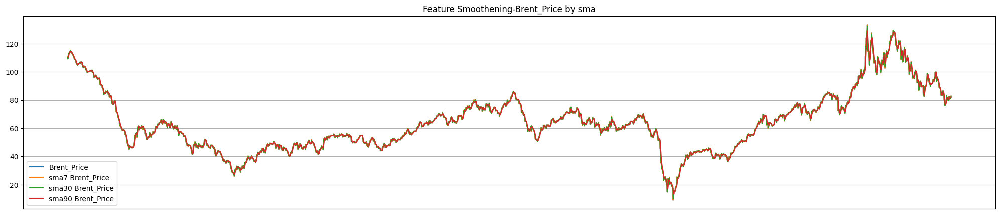

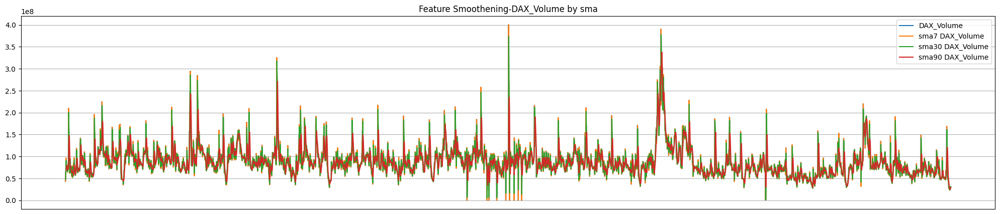

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'sma',show_plot=True)

Weighted Moving Average

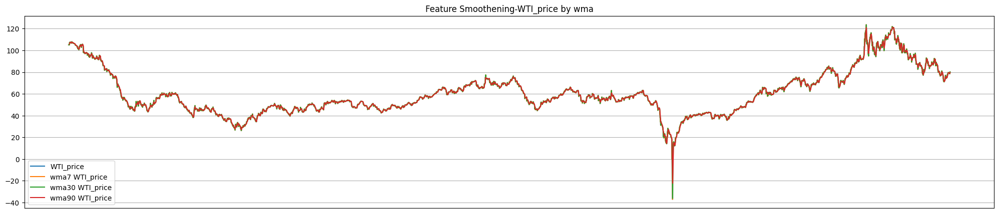

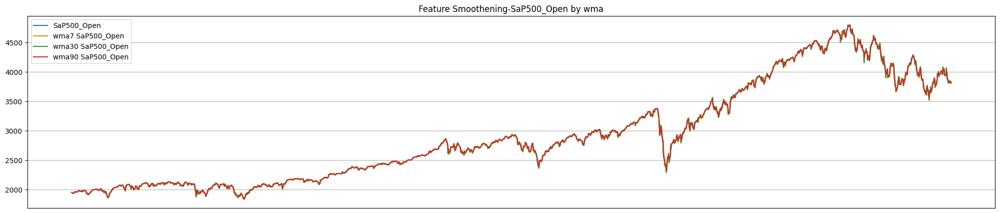

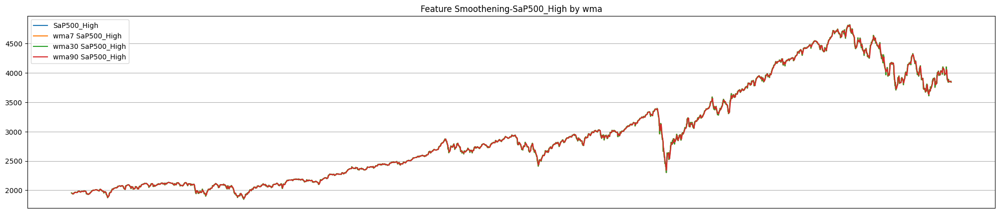

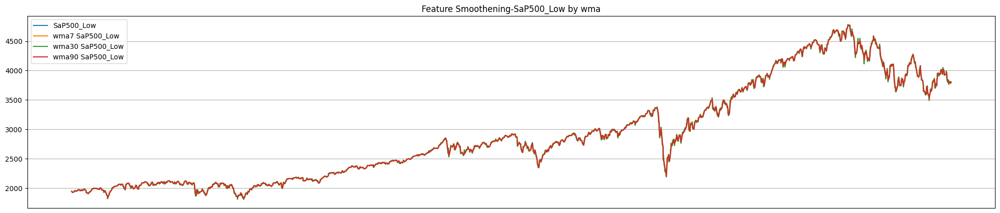

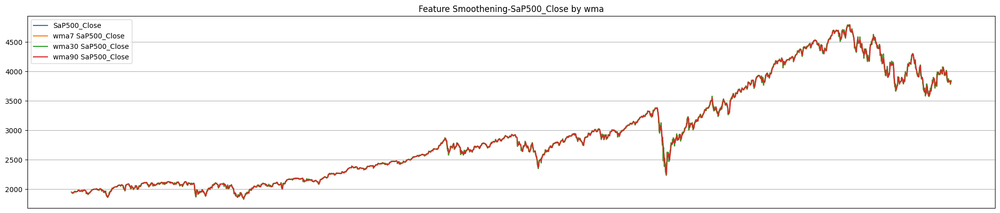

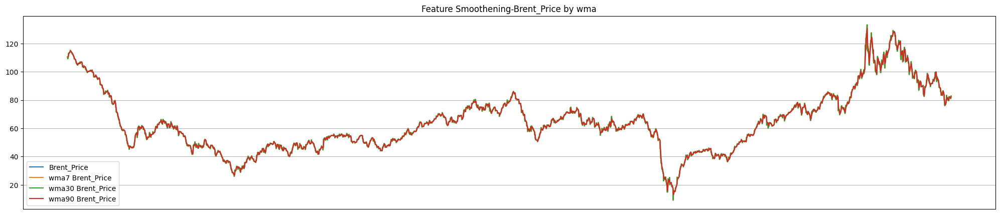

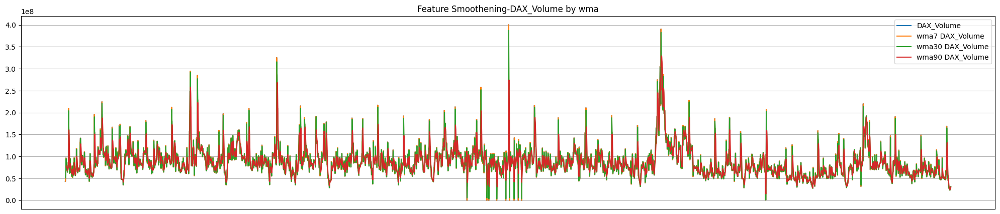

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'wma',show_plot=True)

Exponential Moving Average

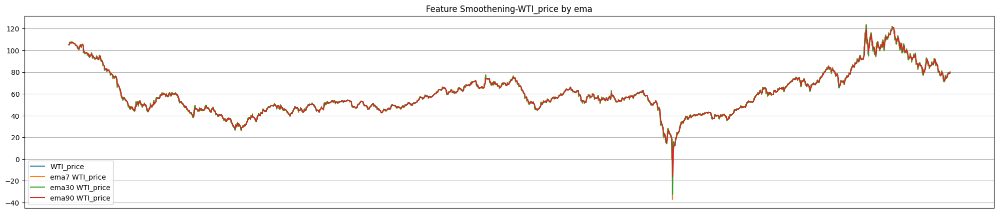

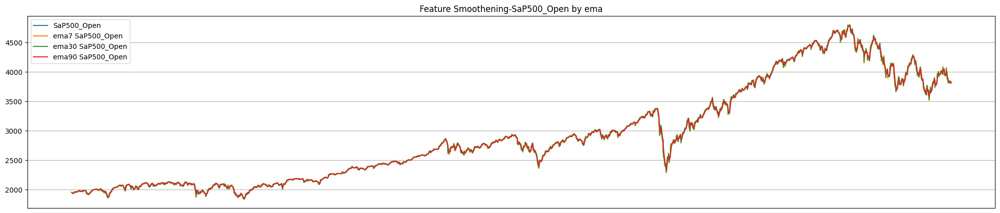

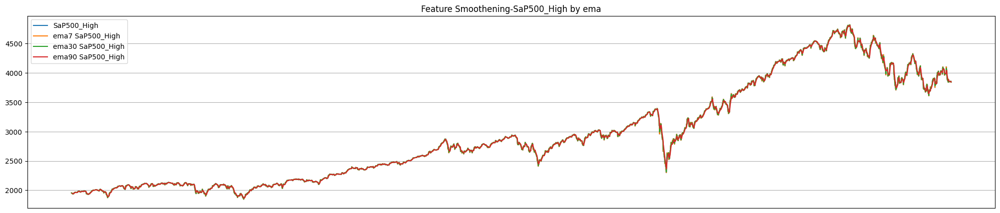

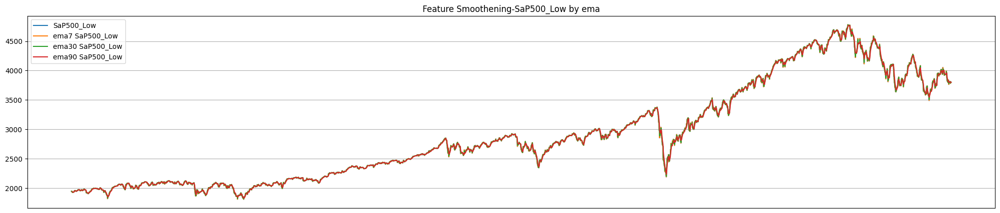

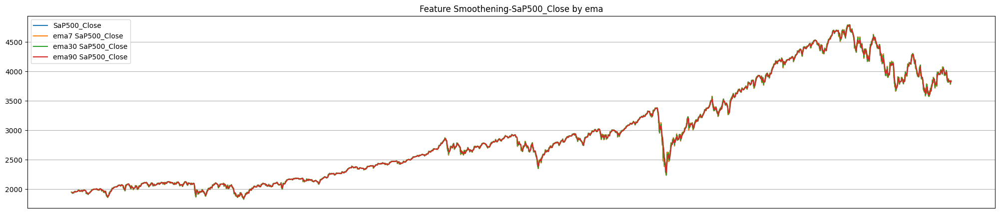

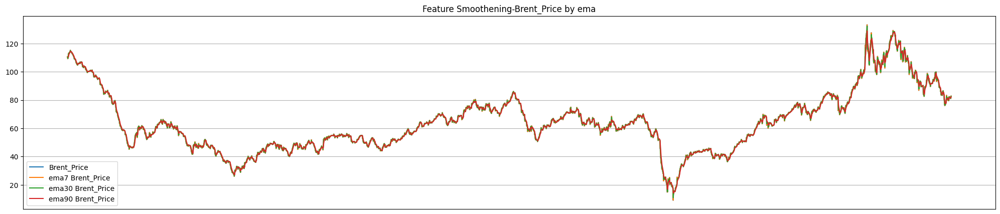

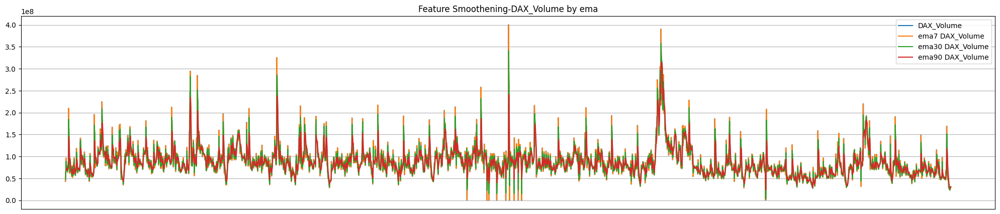

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'ema',show_plot=True)

Double Exponential Moving Average

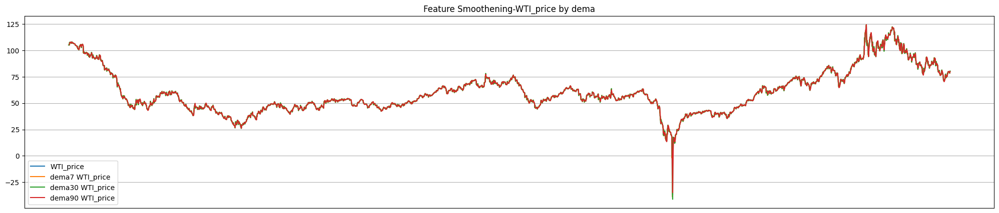

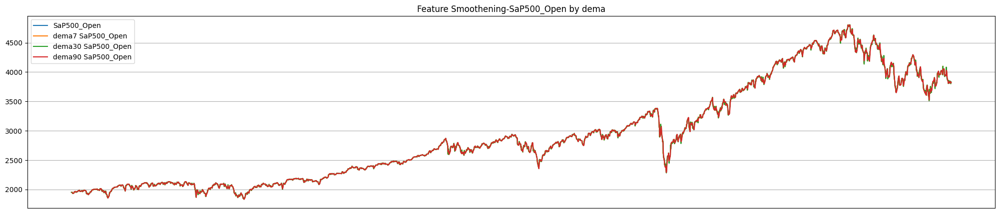

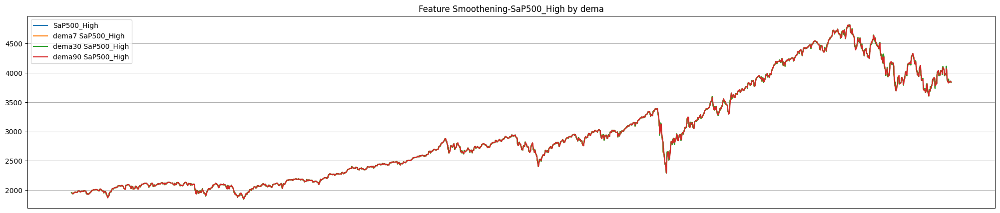

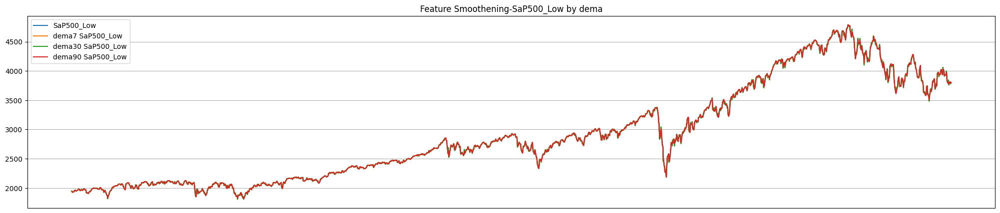

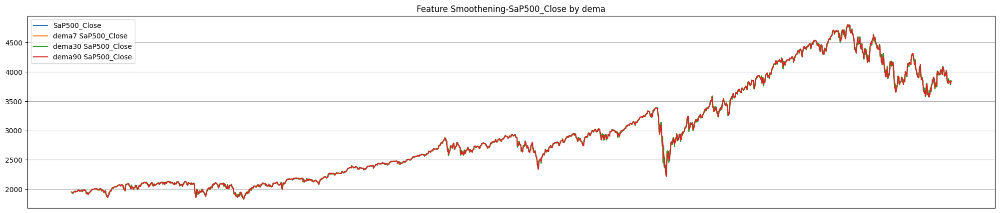

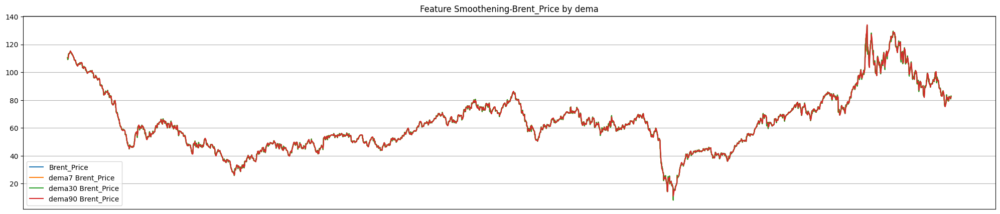

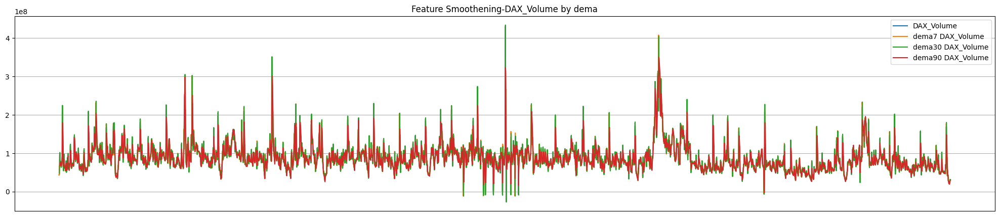

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'dema',show_plot=True)

Triple Exponential Moving Average

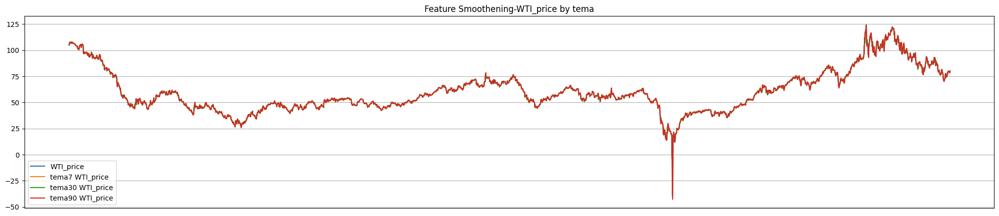

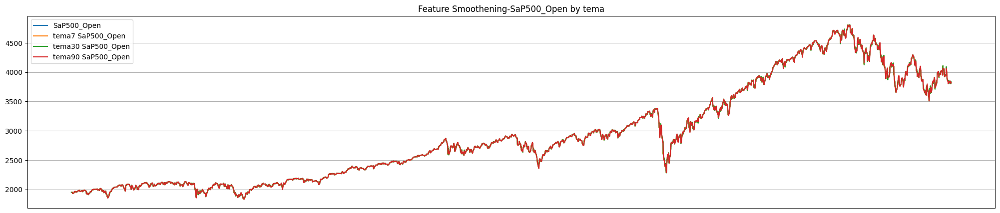

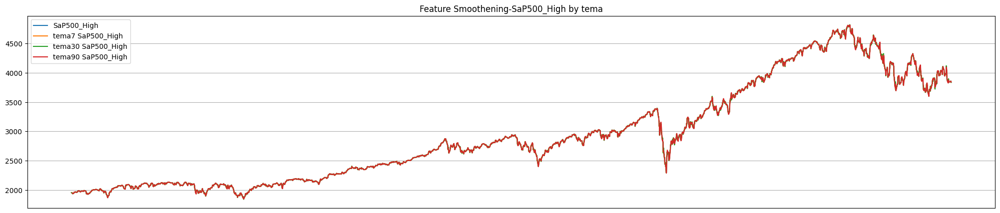

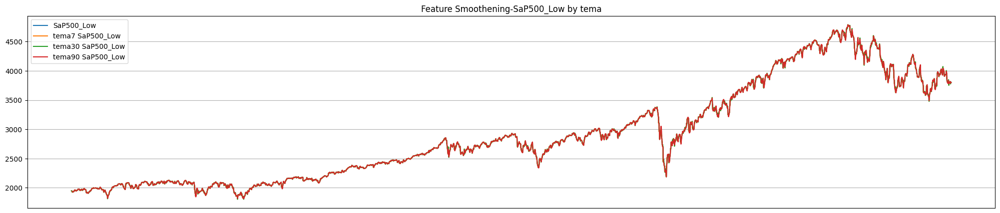

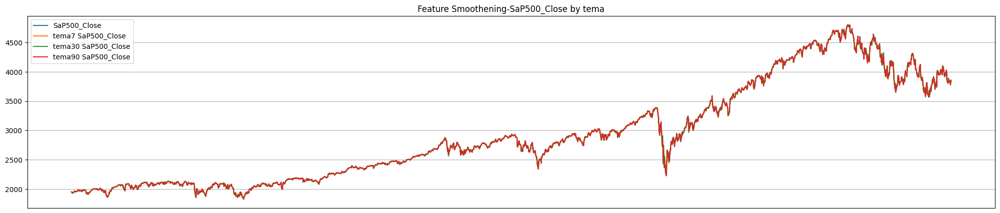

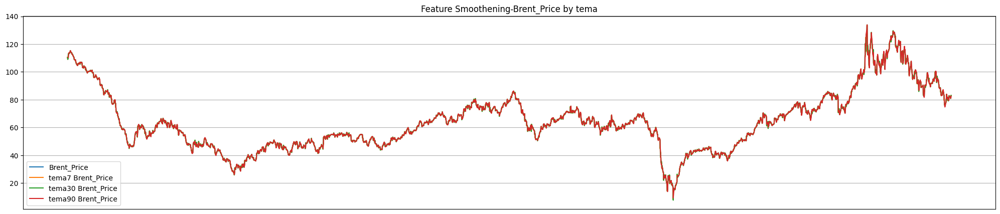

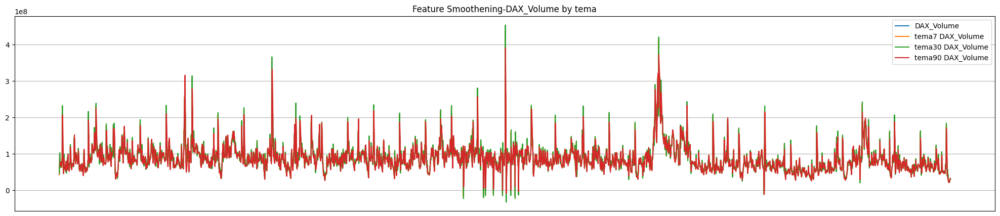

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'tema',show_plot=True)

Standard Deviaiton

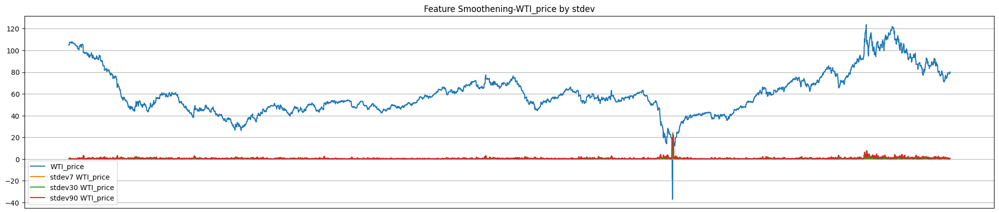

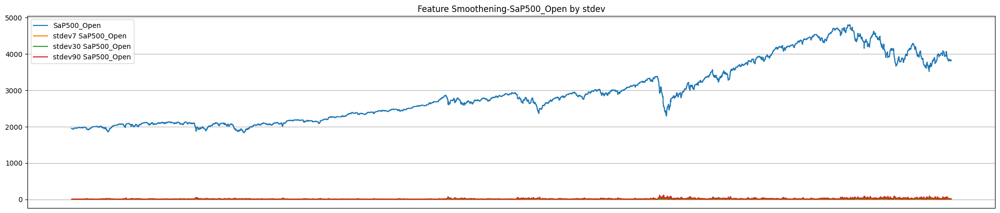

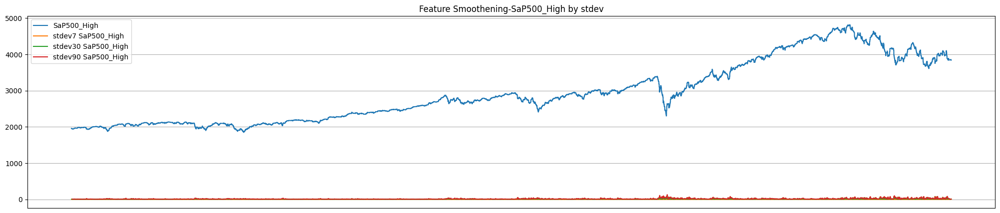

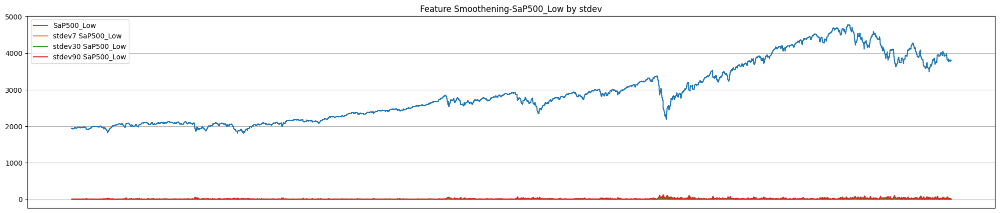

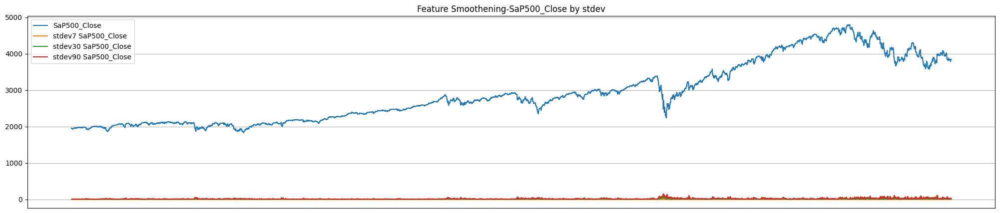

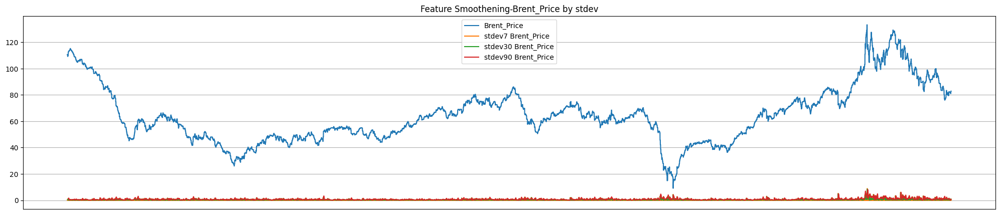

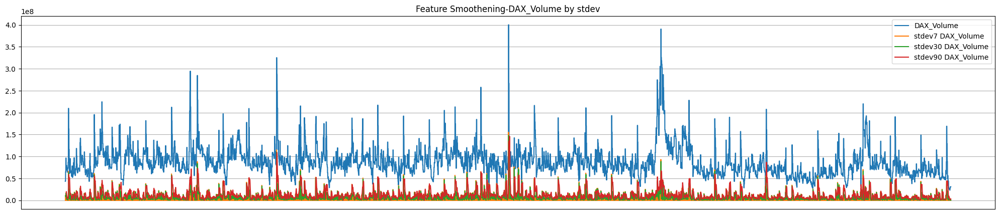

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'stdev',show_plot=True)

Variance

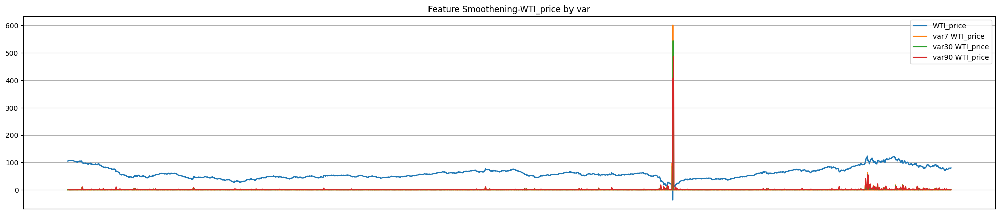

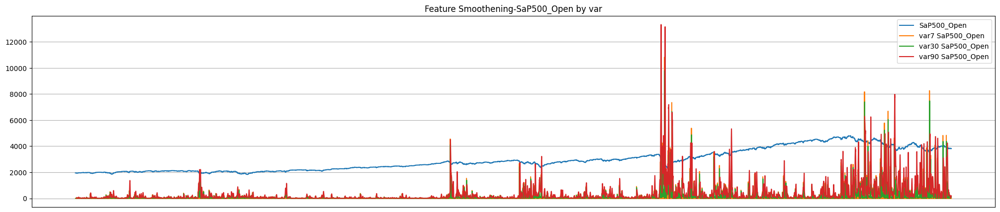

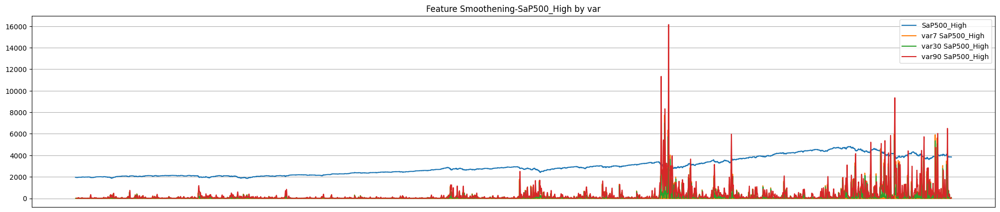

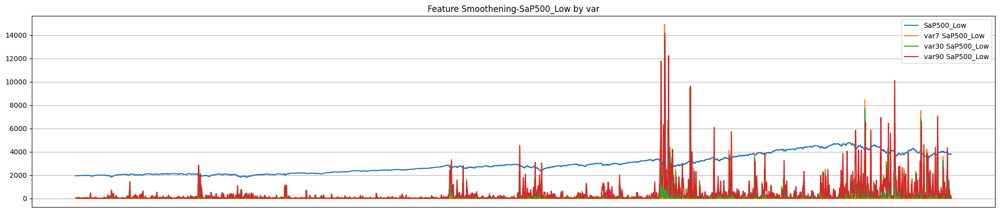

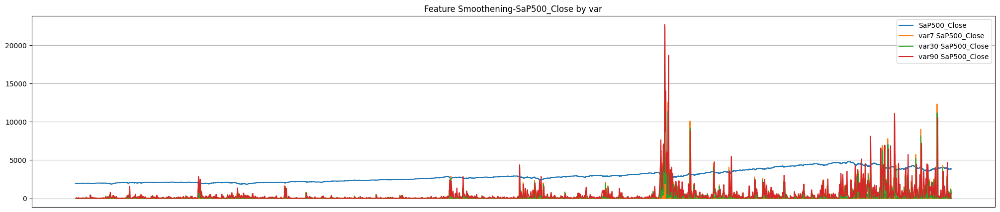

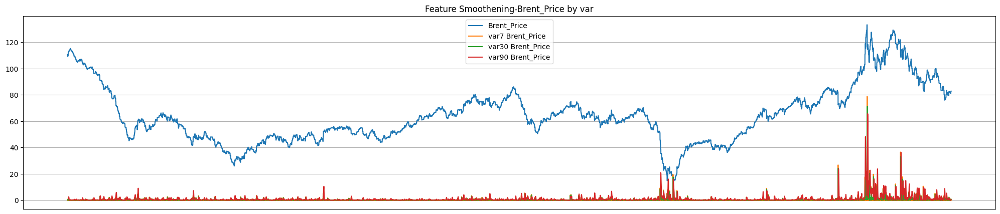

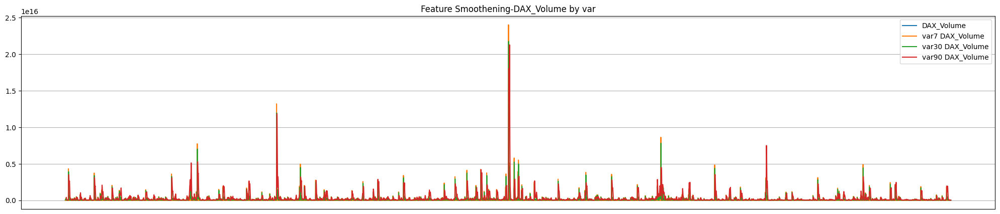

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'var',show_plot=True)

Relative Strength Index

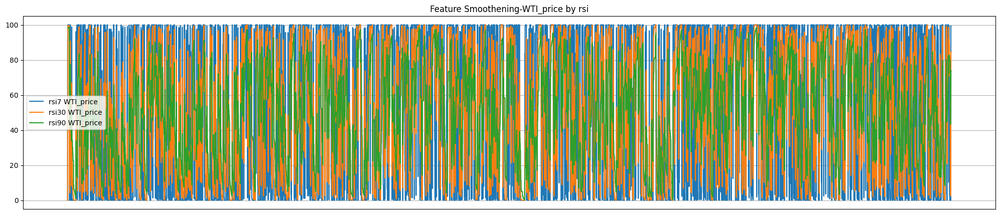

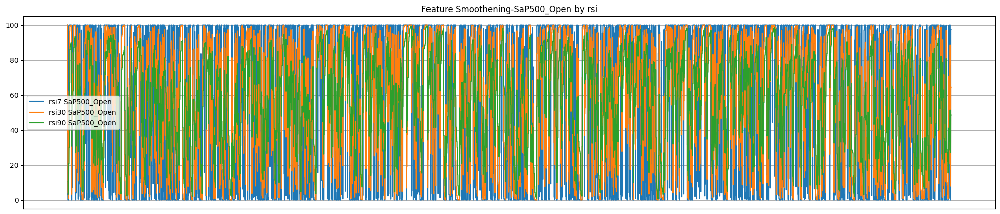

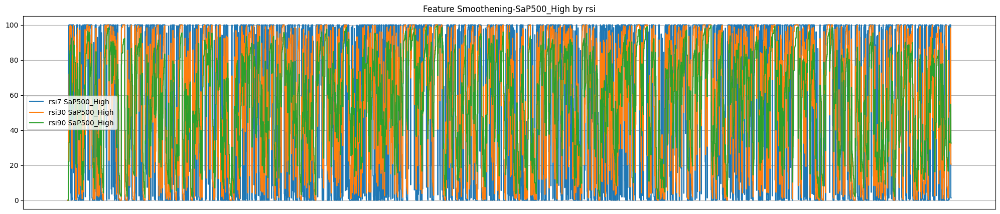

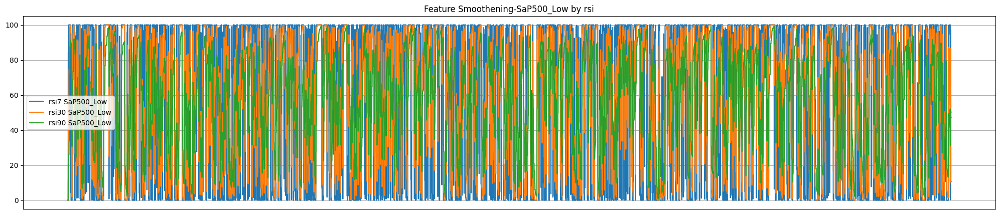

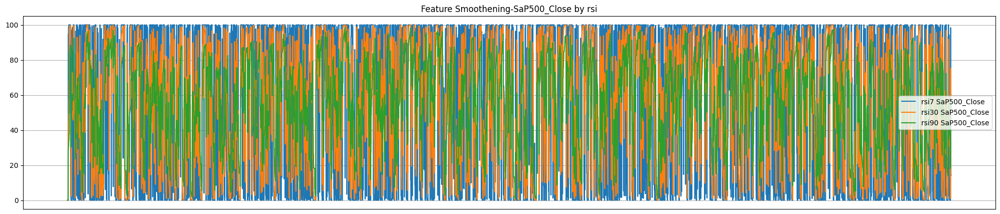

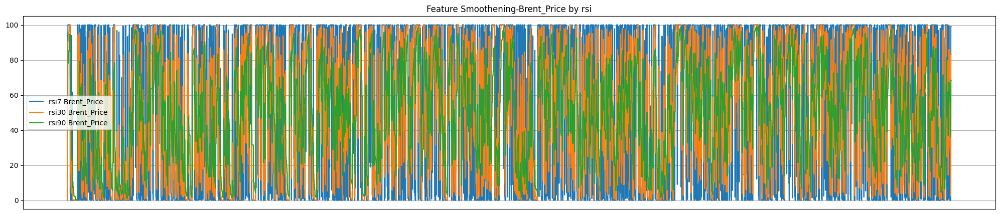

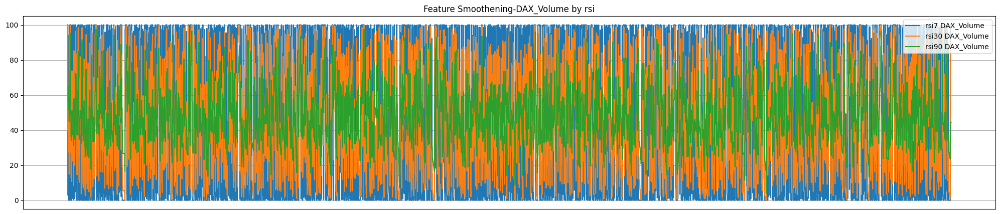

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'rsi',show_plot=True,show_original_Feature_in_plot=False)

Rate of Change

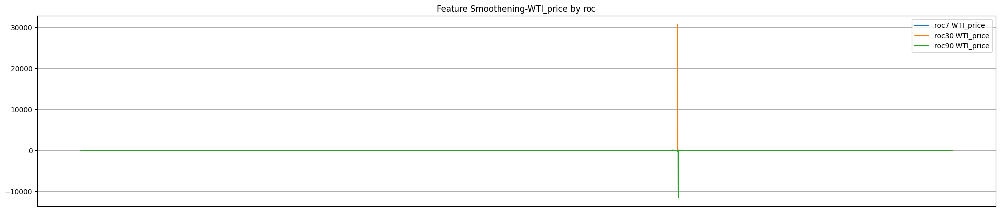

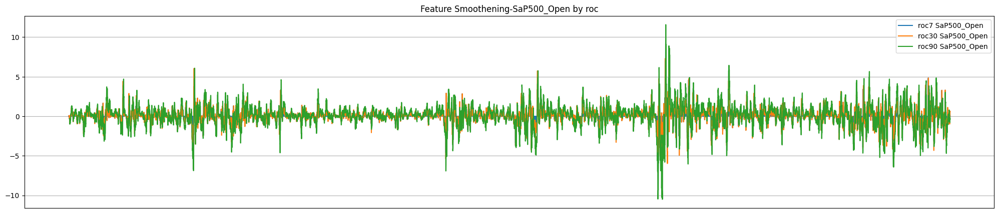

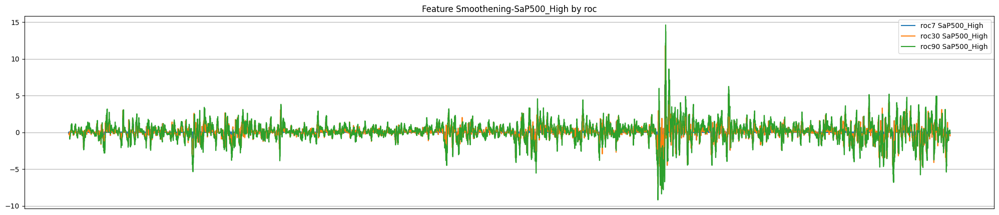

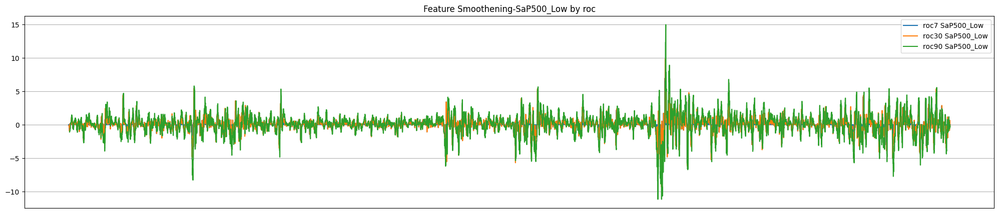

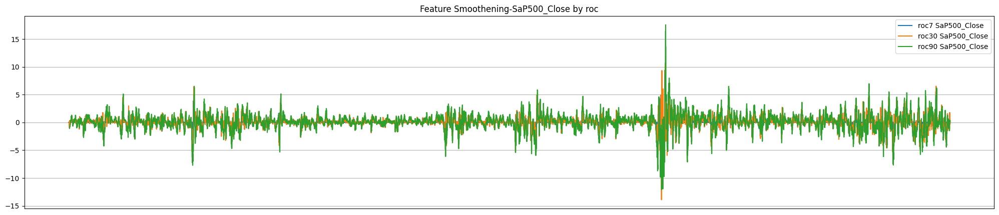

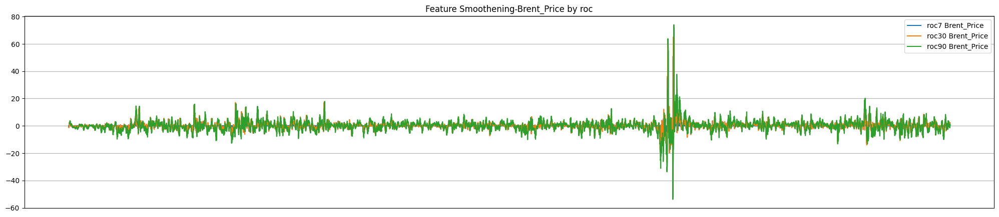

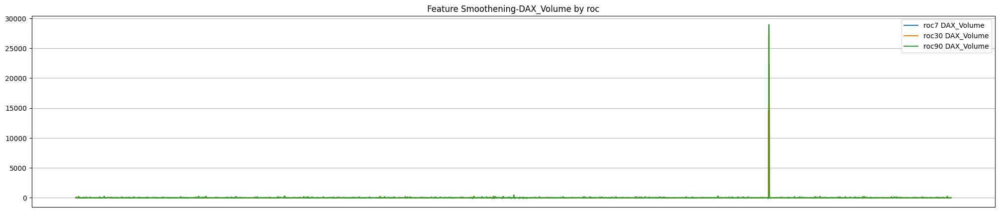

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'roc',show_plot=True,show_original_Feature_in_plot=False)

Bollinger Bands

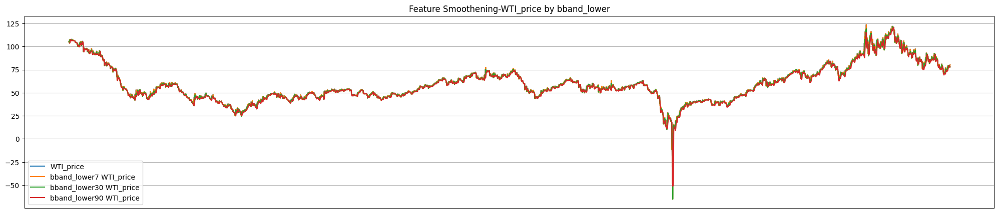

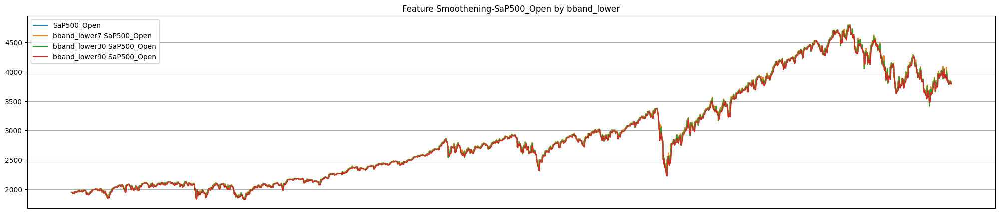

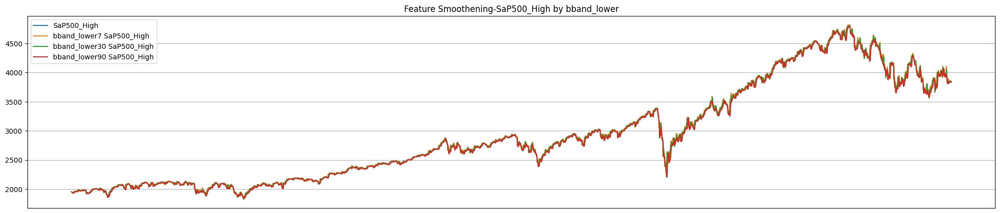

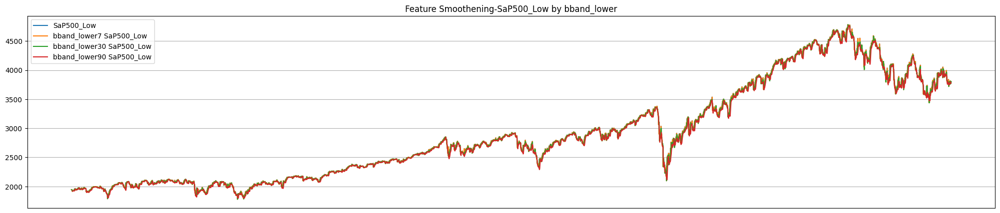

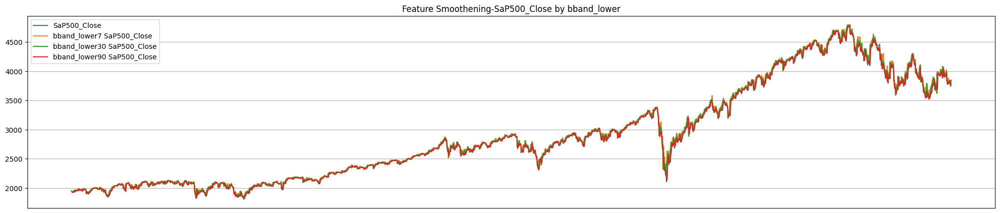

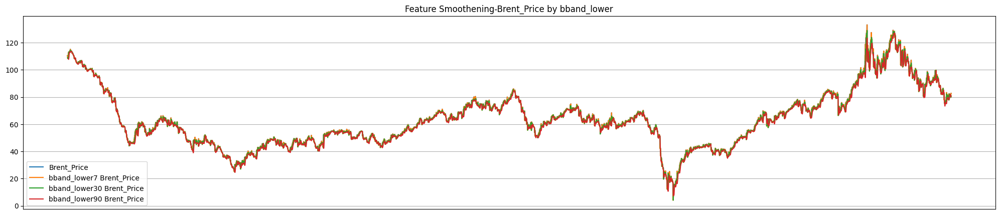

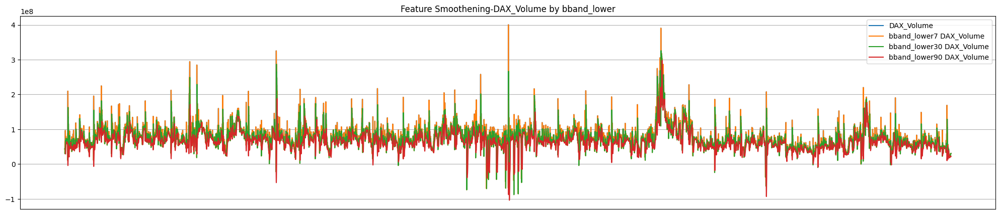

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'bband_lower',show_plot=True)

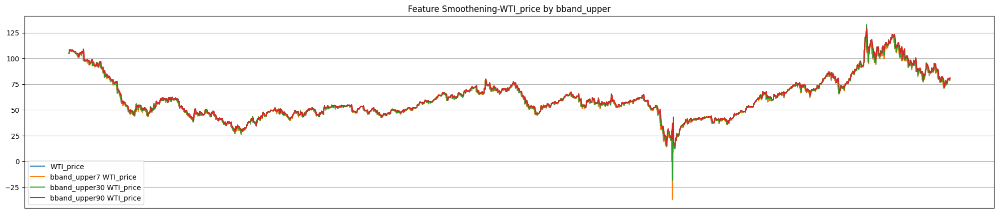

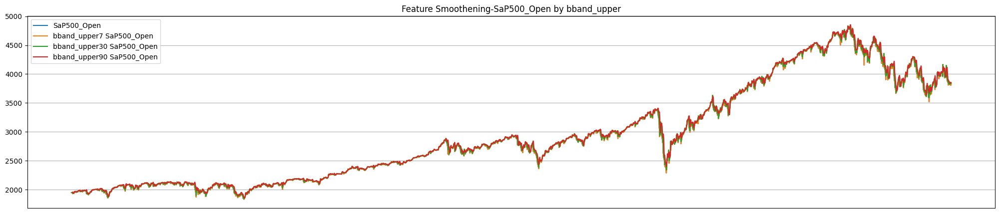

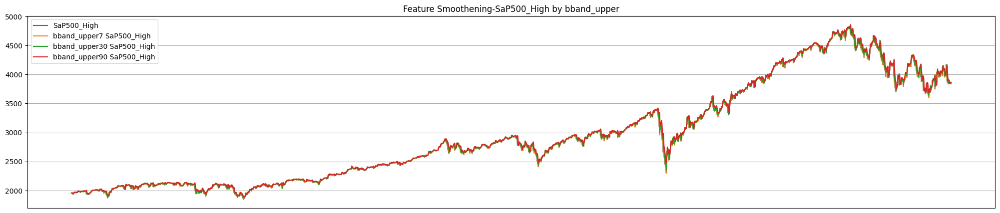

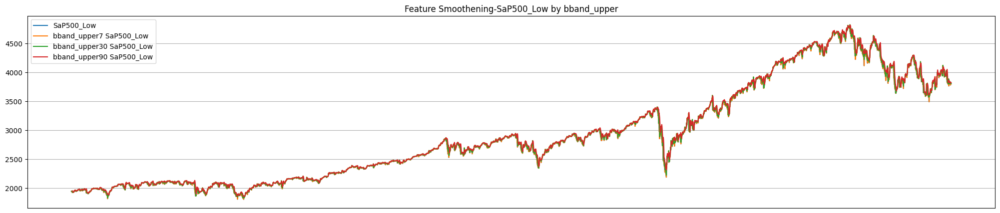

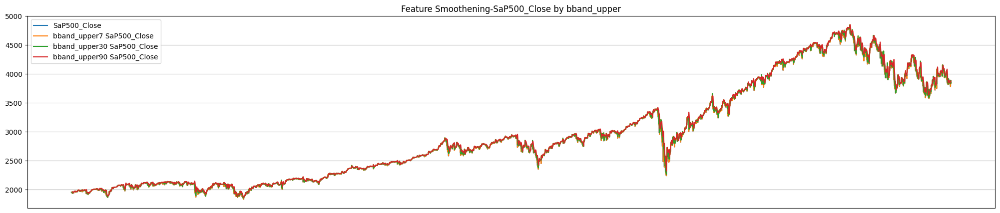

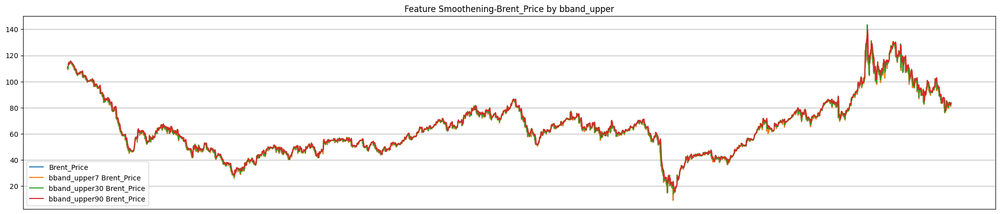

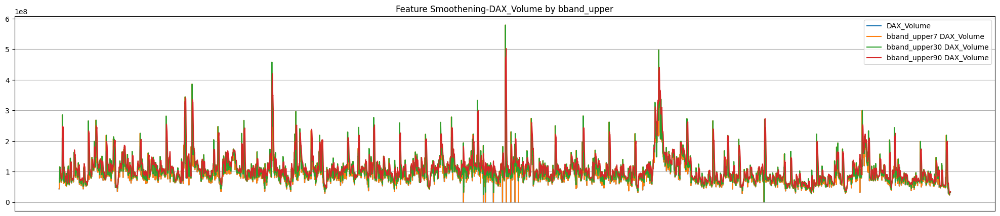

In [ ]:
for feature in feature_list:
    if feature not in ['Date','weekday', 'year', 'month','7th_day_avg_price','30th_day_avg_price','90th_day_avg_price','avg_btc_price']:
        feature_smoothening(final_df,feature,'bband_upper',show_plot=True)

Moving Average Convergence Divergence

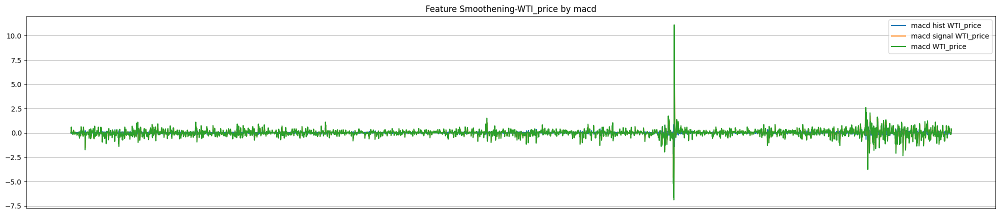

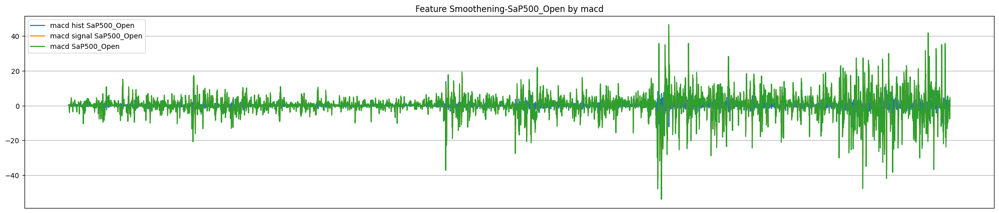

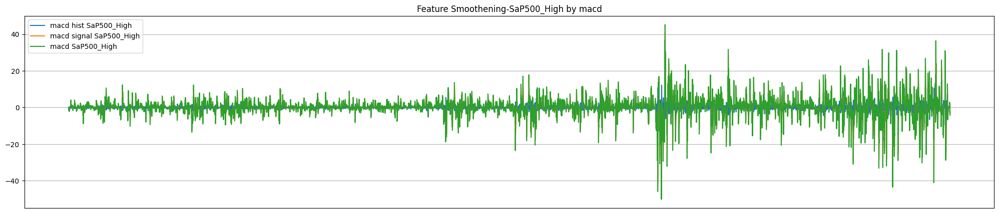

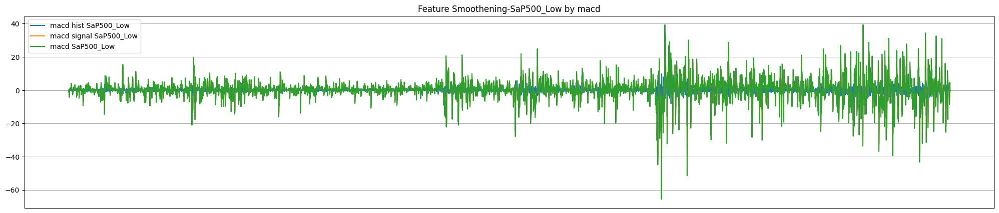

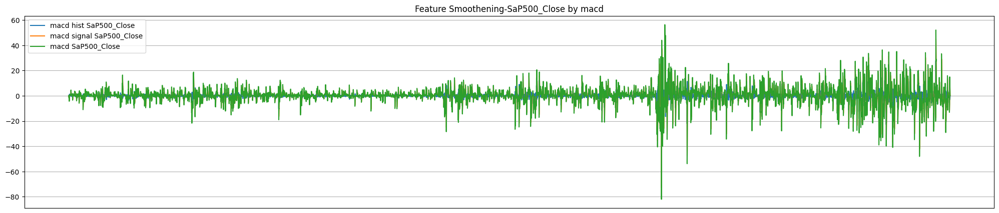

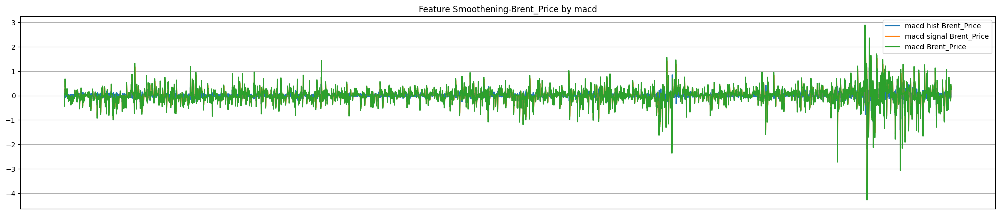

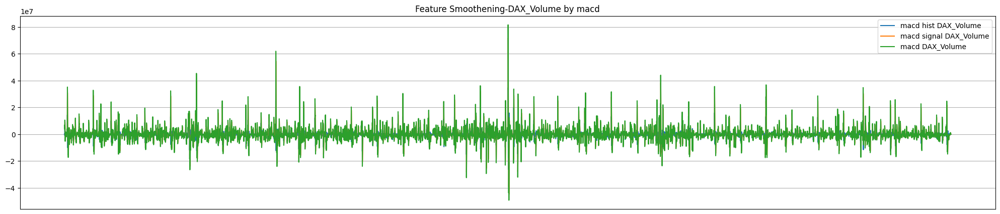

In [ ]:
for feature in feature_list:
    feature_smoothening(final_df,feature,'macd',show_plot=True,show_original_Feature_in_plot=False)

In [ ]:
final_df

,Date,Diesel,E5,E10,WTI_price,SaP500_Open,SaP500_High,SaP500_Low,SaP500_Close,Brent_Price,...,macd SaP500_Low,macd hist SaP500_Close,macd signal SaP500_Close,macd SaP500_Close,macd hist Brent_Price,macd signal Brent_Price,macd Brent_Price,macd hist DAX_Volume,macd signal DAX_Volume,macd DAX_Volume
0,2014-06-09 00:00:00,1.469000,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-06-09 01:00:00,1.469000,1.669000,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-06-09 02:00:00,1.399000,1.619000,1.579000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-06-09 03:00:00,1.369000,1.589000,1.549000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-06-09 04:00:00,1.369000,1.589000,1.549000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75043,2022-12-30 19:00:00,1.782333,1.732333,1.672333,80.16,3828.85,3839.85,3800.34,3839.50,82.82,...,-0.265267,-0.518701,0.710327,0.191626,-0.048264,0.355973,0.307709,-55795.044547,183227.859681,127432.815134
75044,2022-12-30 20:00:00,1.782333,1.729000,1.669000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,...,-0.258813,-0.445737,0.598893,0.153156,-0.052674,0.342805,0.290130,-52055.335199,170214.025881,118158.690683
75045,2022-12-30 21:00:00,1.782333,1.729000,1.669000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,...,-0.250807,-0.382097,0.503369,0.121271,-0.055803,0.328854,0.273051,-48534.339924,158080.440900,109546.100976
75046,2022-12-30 22:00:00,1.779000,1.739000,1.679000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,...,-0.241677,-0.326769,0.421676,0.094908,-0.057836,0.314395,0.256559,-45224.387206,146774.344099,101549.956893


In [ ]:
for column in final_df.columns:
    print(column)


Date
Diesel
E5
E10
WTI_price
SaP500_Open
SaP500_High
SaP500_Low
SaP500_Close
Brent_Price
DAX_Volume
E5_mean
E10_mean
Diesel_mean
E5_lag_1
E5_lag_2
E5_lag_3
E5_lag_7
E5_lag_14
E5_lag_21
E5_lag_30
E10_lag_1
E10_lag_2
E10_lag_3
E10_lag_7
E10_lag_14
E10_lag_21
E10_lag_30
Diesel_lag_1
Diesel_lag_2
Diesel_lag_3
Diesel_lag_7
Diesel_lag_14
Diesel_lag_21
Diesel_lag_30
macd hist E5
macd signal E5
macd E5
macd hist E10
macd signal E10
macd E10
macd hist Diesel
macd signal Diesel
macd Diesel
sma7 WTI_price
sma30 WTI_price
sma90 WTI_price
sma7 SaP500_Open
sma30 SaP500_Open
sma90 SaP500_Open
sma7 SaP500_High
sma30 SaP500_High
sma90 SaP500_High
sma7 SaP500_Low
sma30 SaP500_Low
sma90 SaP500_Low
sma7 SaP500_Close
sma30 SaP500_Close
sma90 SaP500_Close
sma7 Brent_Price
sma30 Brent_Price
sma90 Brent_Price
sma7 DAX_Volume
sma30 DAX_Volume
sma90 DAX_Volume
wma7 WTI_price
wma30 WTI_price
wma90 WTI_price
wma7 SaP500_Open
wma30 SaP500_Open
wma90 SaP500_Open
wma7 SaP500_High
wma30 SaP500_High
wma90 SaP500_High


In [ ]:
e5_df = final_df.copy()
e5_df = e5_df.drop(['E10','E10_mean','Diesel','Diesel_mean','E10_lag_1','E10_lag_2','E10_lag_3','E10_lag_7','E10_lag_14','E10_lag_21','E10_lag_30','Diesel_lag_1','Diesel_lag_2','Diesel_lag_3','Diesel_lag_7','Diesel_lag_14','Diesel_lag_21','Diesel_lag_30','macd hist E10','macd signal E10','macd E10','macd hist Diesel','macd signal Diesel','macd Diesel'], axis = 1)
e5_df

,Date,E5,WTI_price,SaP500_Open,SaP500_High,SaP500_Low,SaP500_Close,Brent_Price,DAX_Volume,E5_mean,...,macd SaP500_Low,macd hist SaP500_Close,macd signal SaP500_Close,macd SaP500_Close,macd hist Brent_Price,macd signal Brent_Price,macd Brent_Price,macd hist DAX_Volume,macd signal DAX_Volume,macd DAX_Volume
0,2014-06-09 00:00:00,1.669000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.628269,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-06-09 01:00:00,1.669000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.601752,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-06-09 02:00:00,1.619000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.596050,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-06-09 03:00:00,1.589000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.587817,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-06-09 04:00:00,1.589000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.588743,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75043,2022-12-30 19:00:00,1.732333,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.750966,...,-0.265267,-0.518701,0.710327,0.191626,-0.048264,0.355973,0.307709,-55795.044547,183227.859681,127432.815134
75044,2022-12-30 20:00:00,1.729000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.733389,...,-0.258813,-0.445737,0.598893,0.153156,-0.052674,0.342805,0.290130,-52055.335199,170214.025881,118158.690683
75045,2022-12-30 21:00:00,1.729000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.721396,...,-0.250807,-0.382097,0.503369,0.121271,-0.055803,0.328854,0.273051,-48534.339924,158080.440900,109546.100976
75046,2022-12-30 22:00:00,1.739000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.778199,...,-0.241677,-0.326769,0.421676,0.094908,-0.057836,0.314395,0.256559,-45224.387206,146774.344099,101549.956893


In [ ]:
e10_df = final_df.copy()
e10_df = e10_df.drop(['E5','E5_mean','Diesel','Diesel_mean','E5_lag_1','E5_lag_2','E5_lag_3','E5_lag_7','E5_lag_14','E5_lag_21','E5_lag_30','Diesel_lag_1','Diesel_lag_2','Diesel_lag_3','Diesel_lag_7','Diesel_lag_14','Diesel_lag_21','Diesel_lag_30','macd hist E5','macd signal E5','macd E5','macd hist Diesel','macd signal Diesel','macd Diesel'], axis = 1)
e10_df

,Date,E10,WTI_price,SaP500_Open,SaP500_High,SaP500_Low,SaP500_Close,Brent_Price,DAX_Volume,E10_mean,...,macd SaP500_Low,macd hist SaP500_Close,macd signal SaP500_Close,macd SaP500_Close,macd hist Brent_Price,macd signal Brent_Price,macd Brent_Price,macd hist DAX_Volume,macd signal DAX_Volume,macd DAX_Volume
0,2014-06-09 00:00:00,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.589088,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-06-09 01:00:00,1.629000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.564805,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-06-09 02:00:00,1.579000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.556050,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-06-09 03:00:00,1.549000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.547506,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-06-09 04:00:00,1.549000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.548762,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75043,2022-12-30 19:00:00,1.672333,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.692774,...,-0.265267,-0.518701,0.710327,0.191626,-0.048264,0.355973,0.307709,-55795.044547,183227.859681,127432.815134
75044,2022-12-30 20:00:00,1.669000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.675177,...,-0.258813,-0.445737,0.598893,0.153156,-0.052674,0.342805,0.290130,-52055.335199,170214.025881,118158.690683
75045,2022-12-30 21:00:00,1.669000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.664292,...,-0.250807,-0.382097,0.503369,0.121271,-0.055803,0.328854,0.273051,-48534.339924,158080.440900,109546.100976
75046,2022-12-30 22:00:00,1.679000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.720781,...,-0.241677,-0.326769,0.421676,0.094908,-0.057836,0.314395,0.256559,-45224.387206,146774.344099,101549.956893


In [ ]:
diesel_df = final_df.copy()
diesel_df = diesel_df.drop(['E10','E10_mean','E5','E5_mean','E10_lag_1','E10_lag_2','E10_lag_3','E10_lag_7','E10_lag_14','E10_lag_21','E10_lag_30','E5_lag_1','E5_lag_2','E5_lag_3','E5_lag_7','E5_lag_14','E5_lag_21','E5_lag_30','macd hist E10','macd signal E10','macd E10','macd hist E5','macd signal E5','macd E5'], axis = 1)
diesel_df

,Date,Diesel,WTI_price,SaP500_Open,SaP500_High,SaP500_Low,SaP500_Close,Brent_Price,DAX_Volume,Diesel_mean,...,macd SaP500_Low,macd hist SaP500_Close,macd signal SaP500_Close,macd SaP500_Close,macd hist Brent_Price,macd signal Brent_Price,macd Brent_Price,macd hist DAX_Volume,macd signal DAX_Volume,macd DAX_Volume
0,2014-06-09 00:00:00,1.469000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.419305,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-06-09 01:00:00,1.469000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.389906,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-06-09 02:00:00,1.399000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.384243,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-06-09 03:00:00,1.369000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.376842,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-06-09 04:00:00,1.369000,105.09,1948.97,1955.55,1947.16,1951.27,110.55,43200400.0,1.378618,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75043,2022-12-30 19:00:00,1.782333,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.806778,...,-0.265267,-0.518701,0.710327,0.191626,-0.048264,0.355973,0.307709,-55795.044547,183227.859681,127432.815134
75044,2022-12-30 20:00:00,1.782333,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.787536,...,-0.258813,-0.445737,0.598893,0.153156,-0.052674,0.342805,0.290130,-52055.335199,170214.025881,118158.690683
75045,2022-12-30 21:00:00,1.782333,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.780922,...,-0.250807,-0.382097,0.503369,0.121271,-0.055803,0.328854,0.273051,-48534.339924,158080.440900,109546.100976
75046,2022-12-30 22:00:00,1.779000,80.16,3828.85,3839.85,3800.34,3839.50,82.82,30727400.0,1.829777,...,-0.241677,-0.326769,0.421676,0.094908,-0.057836,0.314395,0.256559,-45224.387206,146774.344099,101549.956893


In [ ]:
#Dropping rows with infinite and nan values
e5_df = e5_df[~e5_df.isin([np.nan, np.inf, -np.inf]).any(1)]
e10_df = e10_df[~e10_df.isin([np.nan, np.inf, -np.inf]).any(1)]
diesel_df = diesel_df[~diesel_df.isin([np.nan, np.inf, -np.inf]).any(1)]

#Splits

Test-Train Split

In [ ]:
test_size = 0.05
from pylab import rcParams

In [ ]:
# Get sizes of each of the datasets

num_test = int(test_size*len(final_df))
num_train = len(final_df) - num_test
print("num_train = " + str(num_train))
print("num_test = " + str(num_test))

# Split into train and test
train_e5 = e5_df[:num_train]
test_e5 = e5_df[num_train:]

train_e10 = e10_df[:num_train]
test_e10 = e10_df[num_train:]

train_diesel = diesel_df[:num_train]
test_diesel = diesel_df[num_train:]

num_train = 71296
num_test = 3752


X y Split

In [ ]:
X_train_e5 = train_e5.drop(['Date', 'E5'], axis = 1)
y_train_e5 = train_e5[['E5']]
X_test_e5 = test_e5.drop(['Date', 'E5'], axis = 1)
y_test_e5 = test_e5[['E5']]

X_train_e10 = train_e10.drop(['Date', 'E10'], axis = 1)
y_train_e10 = train_e10[['E10']]
X_test_e10 = test_e10.drop(['Date', 'E10'], axis = 1)
y_test_e10 = test_e10[['E10']]

X_train_diesel = train_diesel.drop(['Date', 'Diesel'], axis = 1)
y_train_diesel = train_diesel[['Diesel']]
X_test_diesel = test_diesel.drop(['Date', 'Diesel'], axis = 1)
y_test_diesel = test_diesel[['Diesel']]

#Feature Scaling

E5

In [ ]:
# Fit the RobustScaler on the training set
robust_scaler_e5 = RobustScaler()
robust_scaler_e5.fit(X_train_e5)

# Transform both the training and test sets using the trained scaler
X_train_e5_scaled = X_train_e5.copy()
X_test_e5_scaled = X_test_e5.copy()

X_train_e5_scaled[X_train_e5.columns] = robust_scaler_e5.transform(X_train_e5[X_train_e5.columns])
X_test_e5_scaled[X_test_e5.columns] = robust_scaler_e5.transform(X_test_e5[X_test_e5.columns])

# Fit the MinMaxScaler on the scaled training set
minmax_scaler_e5 = MinMaxScaler()
minmax_scaler_e5.fit(X_train_e5_scaled)

# Transform both the training and test sets using the trained MinMaxScaler
X_train_e5_scaled[X_train_e5.columns] = minmax_scaler_e5.transform(X_train_e5_scaled[X_train_e5.columns])
X_test_e5_scaled[X_test_e5.columns] = minmax_scaler_e5.transform(X_test_e5_scaled[X_test_e5.columns])


'''scaler_e5 = RobustScaler()
scaler_e5.fit(X_train_e5)


scaled_train_e5 = scaler_e5.transform(X_train_e5)

scaled_test_e5 = scaler_e5.transform(X_test_e5)

scaler_e5 = MinMaxScaler()
scaler_e5.fit(scaled_train_e5)

scaled_train_e5 = scaler_e5.transform(X_train_e5)

scaled_test_e5 = scaler_e5.transform(X_test_e5)'''

'scaler_e5 = RobustScaler()\nscaler_e5.fit(X_train_e5)\n\n\nscaled_train_e5 = scaler_e5.transform(X_train_e5)\n\nscaled_test_e5 = scaler_e5.transform(X_test_e5)\n\nscaler_e5 = MinMaxScaler()\nscaler_e5.fit(scaled_train_e5)\n\nscaled_train_e5 = scaler_e5.transform(X_train_e5)\n\nscaled_test_e5 = scaler_e5.transform(X_test_e5)'

E10

In [ ]:
# Fit the RobustScaler on the training set
robust_scaler_e10 = RobustScaler()
robust_scaler_e10.fit(X_train_e10)


# Transform both the training and test sets using the trained scaler
X_train_e10_scaled = X_train_e10.copy()
X_test_e10_scaled = X_test_e10.copy()


X_train_e10_scaled[X_train_e10.columns] = robust_scaler_e10.transform(X_train_e10[X_train_e10.columns])
X_test_e10_scaled[X_test_e10.columns] = robust_scaler_e10.transform(X_test_e10[X_test_e10.columns])


# Fit the MinMaxScaler on the scaled training set
minmax_scaler_e10 = MinMaxScaler()
minmax_scaler_e10.fit(X_train_e10_scaled)


# Transform both the training and test sets using the trained MinMaxScaler
X_train_e10_scaled[X_train_e10.columns] = minmax_scaler_e10.transform(X_train_e10_scaled[X_train_e10.columns])
X_test_e10_scaled[X_test_e10.columns] = minmax_scaler_e10.transform(X_test_e10_scaled[X_test_e10.columns])



'''scaler_e10 = RobustScaler()
scaler_e10.fit(X_train_e10)


scaled_train_e10 = scaler_e10.transform(X_train_e10)

scaled_test_e10 = scaler_e10.transform(X_test_e10)

scaler_e10 = MinMaxScaler()
scaler_e10.fit(scaled_train_e10)

scaled_train_e10 = scaler_e10.transform(X_train_e10)

scaled_test_e10 = scaler_e10.transform(X_test_e10)'''

'scaler_e10 = RobustScaler()\nscaler_e10.fit(X_train_e10)\n\n\nscaled_train_e10 = scaler_e10.transform(X_train_e10)\n\nscaled_test_e10 = scaler_e10.transform(X_test_e10)\n\nscaler_e10 = MinMaxScaler()\nscaler_e10.fit(scaled_train_e10)\n\nscaled_train_e10 = scaler_e10.transform(X_train_e10)\n\nscaled_test_e10 = scaler_e10.transform(X_test_e10)'

Diesel

In [ ]:
# Fit the RobustScaler on the training set
robust_scaler_diesel = RobustScaler()
robust_scaler_diesel.fit(X_train_diesel)


# Transform both the training and test sets using the trained scaler
X_train_diesel_scaled = X_train_diesel.copy()
X_test_diesel_scaled = X_test_diesel.copy()


X_train_diesel_scaled[X_train_diesel.columns] = robust_scaler_diesel.transform(X_train_diesel[X_train_diesel.columns])
X_test_diesel_scaled[X_test_diesel.columns] = robust_scaler_diesel.transform(X_test_diesel[X_test_diesel.columns])


# Fit the MinMaxScaler on the scaled training set
minmax_scaler_diesel = MinMaxScaler()
minmax_scaler_diesel.fit(X_train_diesel_scaled)


# Transform both the training and test sets using the trained MinMaxScaler
X_train_diesel_scaled[X_train_diesel.columns] = minmax_scaler_diesel.transform(X_train_diesel_scaled[X_train_diesel.columns])
X_test_diesel_scaled[X_test_diesel.columns] = minmax_scaler_diesel.transform(X_test_diesel_scaled[X_test_diesel.columns])



'''scaler_diesel = RobustScaler()
scaler_diesel.fit(X_train_diesel)


scaled_train_diesel = scaler_diesel.transform(X_train_diesel)

scaled_test_diesel = scaler_diesel.transform(X_test_diesel)

scaler_diesel = MinMaxScaler()
scaler_diesel.fit(scaled_train_diesel)

scaled_train_diesel = scaler_diesel.transform(X_train_diesel)

scaled_test_diesel = scaler_diesel.transform(X_test_diesel)'''

'scaler_diesel = RobustScaler()\nscaler_diesel.fit(X_train_diesel)\n\n\nscaled_train_diesel = scaler_diesel.transform(X_train_diesel)\n\nscaled_test_diesel = scaler_diesel.transform(X_test_diesel)\n\nscaler_diesel = MinMaxScaler()\nscaler_diesel.fit(scaled_train_diesel)\n\nscaled_train_diesel = scaler_diesel.transform(X_train_diesel)\n\nscaled_test_diesel = scaler_diesel.transform(X_test_diesel)'

#EDA

Text(0.5, 1.0, 'E5 over time')

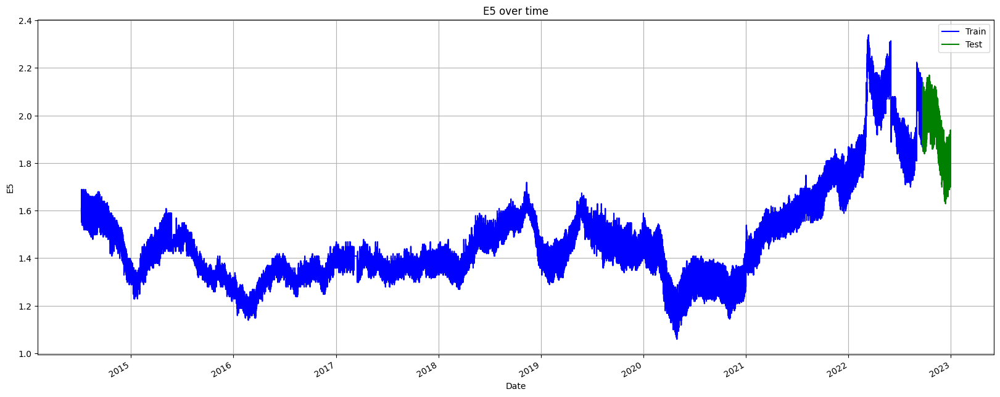

In [ ]:
# Plot E5 over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8

ax = train_e5.plot(x='Date', y='E5', style='b-', grid=True)
ax = test_e5.plot(x='Date', y='E5', style='g-', grid=True, ax=ax)
ax.legend(['Train', 'Test'])
ax.set_xlabel("Date")
ax.set_ylabel("E5")
ax.set_title("E5 over time")

Text(0.5, 1.0, 'E10 over time')

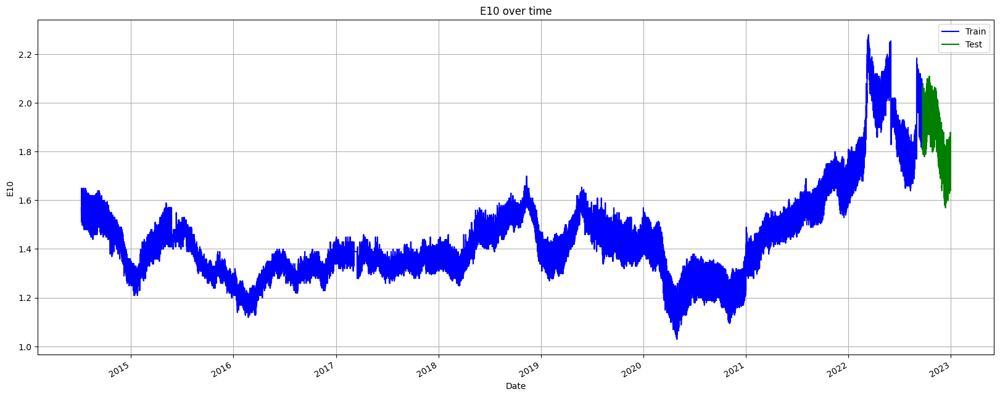

In [ ]:
# Plot E10 over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8


ax = train_e10.plot(x='Date', y='E10', style='b-', grid=True)
ax = test_e10.plot(x='Date', y='E10', style='g-', grid=True, ax=ax)
ax.legend(['Train', 'Test'])
ax.set_xlabel("Date")
ax.set_ylabel("E10")
ax.set_title("E10 over time")

Text(0.5, 1.0, 'Diesel over time')

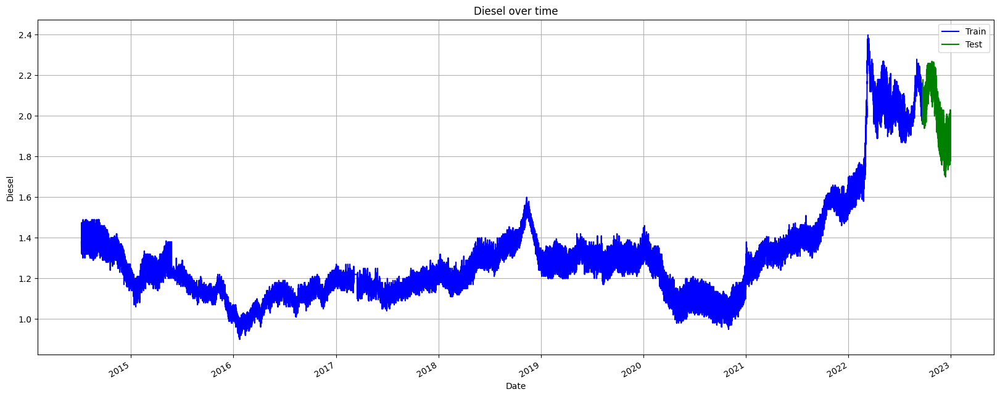

In [ ]:
# Plot Diesel over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8


ax = train_diesel.plot(x='Date', y='Diesel', style='b-', grid=True)
ax = test_diesel.plot(x='Date', y='Diesel', style='g-', grid=True, ax=ax)
ax.legend(['Train', 'Test'])
ax.set_xlabel("Date")
ax.set_ylabel("Diesel")
ax.set_title("Diesel over time")

#Model

##E5

In [ ]:
n_estimators = 100             # Number of boosted trees to fit. default = 100
max_depth = 3                  # Maximum tree depth for base learners. default = 3
learning_rate = 0.1            # Boosting learning rate (xgb’s “eta”). default = 0.1
min_child_weight = 1           # Minimum sum of instance weight(hessian) needed in a child. default = 1
subsample = 1                  # Subsample ratio of the training instance. default = 1
colsample_bytree = 1           # Subsample ratio of columns when constructing each tree. default = 1
colsample_bylevel = 1          # Subsample ratio of columns for each split, in each level. default = 1
gamma = 0                      # Minimum loss reduction required to make a further partition on a leaf node of the tree. default=0

model_seed = 100

In [ ]:
# Create the model
model_e5 = XGBRegressor(seed=model_seed,
                     n_estimators=n_estimators,
                     max_depth=max_depth,
                     learning_rate=learning_rate,
                     min_child_weight=min_child_weight,
                     subsample=subsample,
                     colsample_bytree=colsample_bytree,
                     colsample_bylevel=colsample_bylevel,
                     gamma=gamma)

# Train the regressor
model_e5.fit(X_train_e5_scaled, y_train_e5)

XGBRegressor(base_score=None, booster=None, callbacks=None, colsample_bylevel=1,
             colsample_bynode=None, colsample_bytree=1, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
             max_leaves=None, min_child_weight=1, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [ ]:
#prediction on train set
est_scaled_e5 = model_e5.predict(X_train_e5_scaled)
#est = est_scaled * math.sqrt(scaler.var_[0]) + scaler.mean_[0]

# Calculate RMSE
print("RMSE on train set = %0.3f" % math.sqrt(mean_squared_error(y_train_e5, est_scaled_e5)))

# Calculate MAPE
#print("MAPE on train set = %0.3f%%" % get_mape(y_train, est_scaled))

RMSE on train set = 0.018


Text(0, 0.5, 'E5')

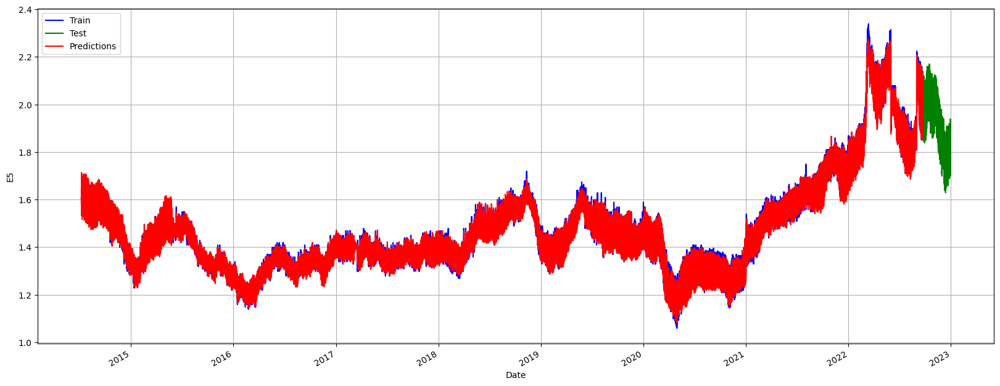

In [ ]:
# Plot E5 over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8

est_e5_df = pd.DataFrame({'est': est_scaled_e5,
                       'Date': train_e5['Date']})

ax = train_e5.plot(x='Date', y='E5', style='b-', grid=True)
ax = test_e5.plot(x='Date', y='E5', style='g-', grid=True, ax=ax)
ax = est_e5_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("E5")

Text(0.5, 1.0, 'Random range of dates')

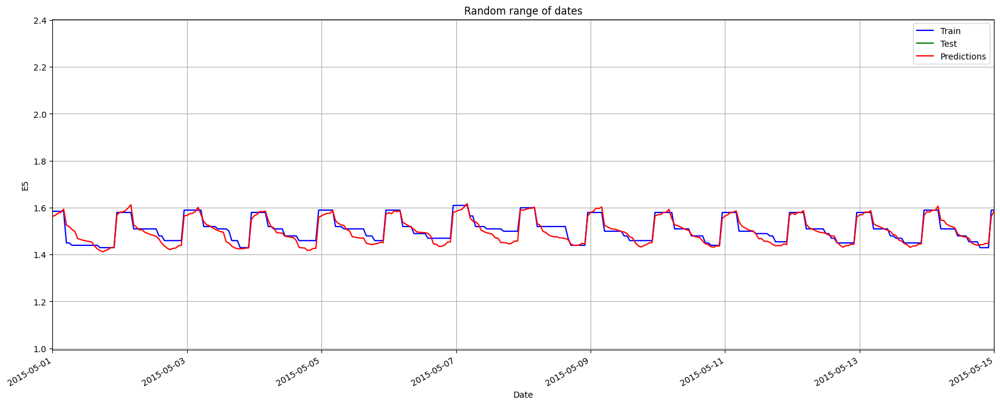

In [ ]:
ax = train_e5.plot(x='Date', y='E5', style='b-', grid=True)
ax = test_e5.plot(x='Date', y='E5', style='g-', grid=True, ax=ax)
ax = est_e5_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("E5")
ax.set_xlim([date(2015, 5, 1), date(2015, 5, 15)])
ax.set_title("Random range of dates")

In [ ]:
#prediction on test set
est_scaled_e5 = model_e5.predict(X_test_e5_scaled)
#cv['est_scaled'] = est_scaled
#cv['est'] = cv['est_scaled'] * cv['e5_std'] + cv['e5_mean']

# Calculate RMSE
rmse_bef_tuning = math.sqrt(mean_squared_error(y_test_e5, est_scaled_e5))
print("RMSE on test set = %0.3f" % rmse_bef_tuning)

# Calculate MAPE
#mape_bef_tuning = get_mape(y_cv, cv['est'])
#print("MAPE on dev set = %0.3f%%" % mape_bef_tuning)

RMSE on test set = 0.029


Text(0, 0.5, 'E5')

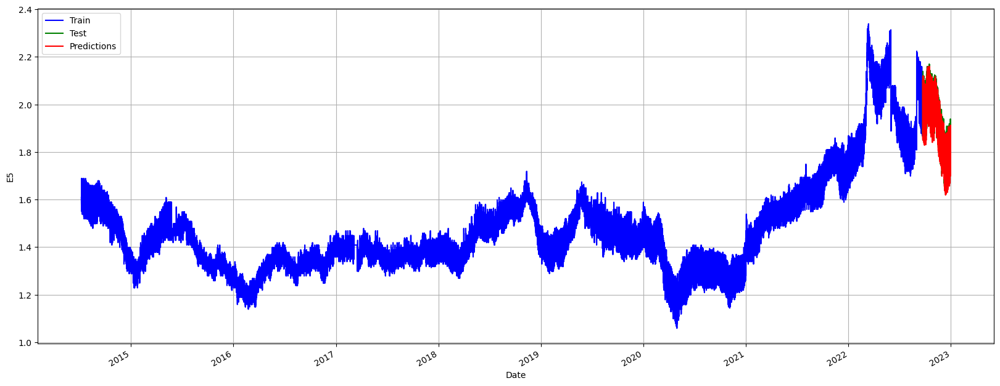

In [ ]:
# Plot E5 over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8

est_e5_df = pd.DataFrame({'est': est_scaled_e5,
                       'Date': test_e5['Date']})

ax = train_e5.plot(x='Date', y='E5', style='b-', grid=True)
ax = test_e5.plot(x='Date', y='E5', style='g-', grid=True, ax=ax)
ax = est_e5_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("E5")

Text(0.5, 1.0, 'Last 5 months prediction')

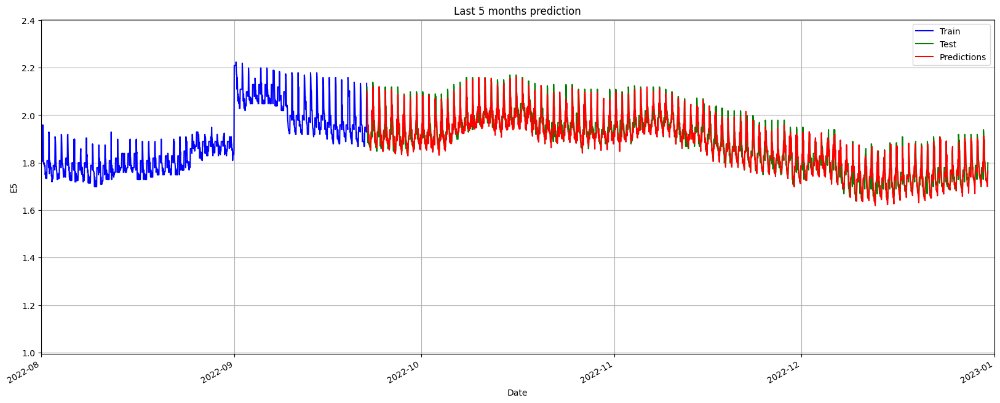

In [ ]:
# Plot E5 over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8

est_df = pd.DataFrame({'est': est_scaled_e5,
                       'Date': test_e5['Date']})

ax = train_e5.plot(x='Date', y='E5', style='b-', grid=True)
ax = test_e5.plot(x='Date', y='E5', style='g-', grid=True, ax=ax)
ax = est_e5_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("E5")
ax.set_xlim([date(2022, 8, 1), date(2023, 1, 1)])
ax.set_title("Last 5 months prediction")

Text(0.5, 1.0, 'Last 5 days prediction')

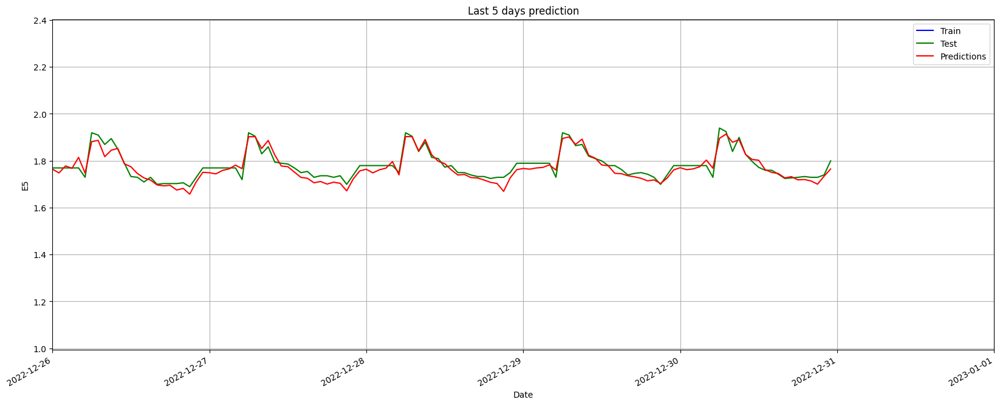

In [ ]:
# Plot E5 over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8

est_df = pd.DataFrame({'est': est_scaled_e5,
                       'Date': test_e5['Date']})

ax = train_e5.plot(x='Date', y='E5', style='b-', grid=True)
ax = test_e5.plot(x='Date', y='E5', style='g-', grid=True, ax=ax)
ax = est_e5_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("E5")
ax.set_xlim([date(2022, 12, 26), date(2023, 1, 1)])
ax.set_title("Last 5 days prediction")

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, median_absolute_error

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test_e5, est_scaled_e5)
print(f"Mean Absolute Error (MAE): {mae}")

# Mean Squared Error (MSE)
mse = mean_squared_error(y_test_e5, est_scaled_e5)
print(f"Mean Squared Error (MSE): {mse}")

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")

# Mean Absolute Percentage Error (MAPE)
y_true, y_pred = np.array(y_test_e5), np.array(est_scaled_e5)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
print(f"Mean Absolute Percentage Error (MAPE): {mape}")

# Coefficient of Determination (R-squared)
r_squared = r2_score(y_test_e5, est_scaled_e5)
print(f"Coefficient of Determination (R-squared): {r_squared}")

# Median Absolute Error (MedAE)
medae = median_absolute_error(y_test_e5, est_scaled_e5)
print(f"Median Absolute Error (MedAE): {medae}")


Mean Absolute Error (MAE): 0.02174764062077346
Mean Squared Error (MSE): 0.0008495176442177852
Root Mean Squared Error (RMSE): 0.02914648596688433
Mean Absolute Percentage Error (MAPE): 6.7905682210594955
Coefficient of Determination (R-squared): 0.9325027670799351
Median Absolute Error (MedAE): 0.016928442955017164


##E10

In [ ]:
# Create the model
model_e10 = XGBRegressor(seed=model_seed,
                     n_estimators=n_estimators,
                     max_depth=max_depth,
                     learning_rate=learning_rate,
                     min_child_weight=min_child_weight,
                     subsample=subsample,
                     colsample_bytree=colsample_bytree,
                     colsample_bylevel=colsample_bylevel,
                     gamma=gamma)


# Train the regressor
model_e10.fit(X_train_e10_scaled, y_train_e10)

XGBRegressor(base_score=None, booster=None, callbacks=None, colsample_bylevel=1,
             colsample_bynode=None, colsample_bytree=1, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
             max_leaves=None, min_child_weight=1, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [ ]:
#prediction on train set
est_scaled_e10 = model_e10.predict(X_train_e10_scaled)
#est = est_scaled * math.sqrt(scaler.var_[0]) + scaler.mean_[0]


# Calculate RMSE
print("RMSE on train set = %0.3f" % math.sqrt(mean_squared_error(y_train_e10, est_scaled_e10)))


# Calculate MAPE
#print("MAPE on train set = %0.3f%%" % get_mape(y_train, est_scaled))


RMSE on train set = 0.018


Text(0, 0.5, 'E10')

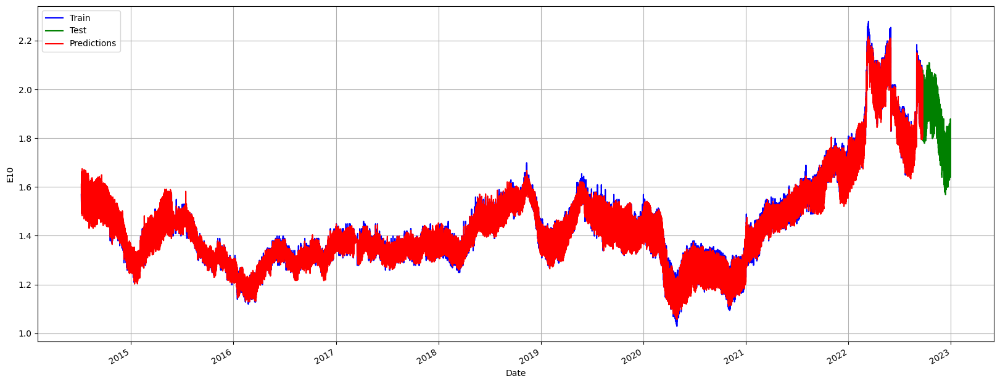

In [ ]:
# Plot E10 over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8


est_e10_df = pd.DataFrame({'est': est_scaled_e10,
                       'Date': train_e10['Date']})


ax = train_e10.plot(x='Date', y='E10', style='b-', grid=True)
ax = test_e10.plot(x='Date', y='E10', style='g-', grid=True, ax=ax)
ax = est_e10_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("E10")

Text(0.5, 1.0, 'Random range of dates')

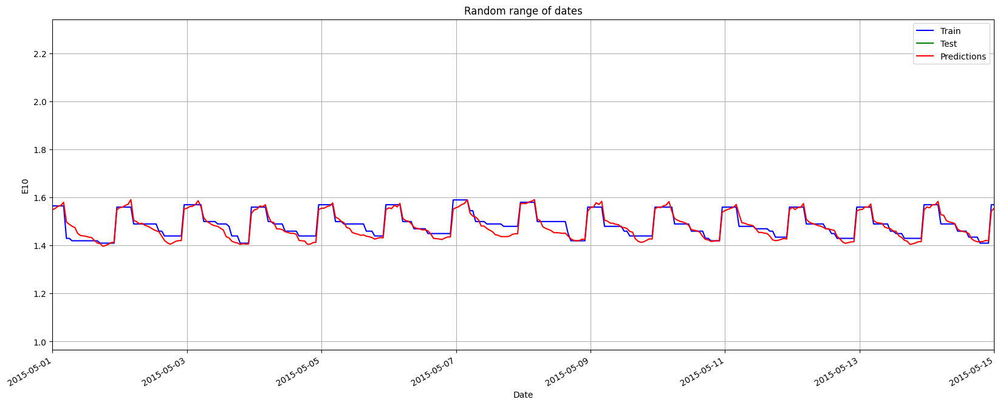

In [ ]:
ax = train_e10.plot(x='Date', y='E10', style='b-', grid=True)
ax = test_e10.plot(x='Date', y='E10', style='g-', grid=True, ax=ax)
ax = est_e10_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("E10")
ax.set_xlim([date(2015, 5, 1), date(2015, 5, 15)])
ax.set_title("Random range of dates")

In [ ]:
#prediction on test set
est_scaled_e10 = model_e10.predict(X_test_e10_scaled)
#cv['est_scaled'] = est_scaled
#cv['est'] = cv['est_scaled'] * cv['e10_std'] + cv['e10_mean']


# Calculate RMSE
rmse_bef_tuning = math.sqrt(mean_squared_error(y_test_e10, est_scaled_e10))
print("RMSE on test set = %0.3f" % rmse_bef_tuning)


# Calculate MAPE
#mape_bef_tuning = get_mape(y_cv, cv['est'])
#print("MAPE on dev set = %0.3f%%" % mape_bef_tuning)


RMSE on test set = 0.029


Text(0, 0.5, 'E10')

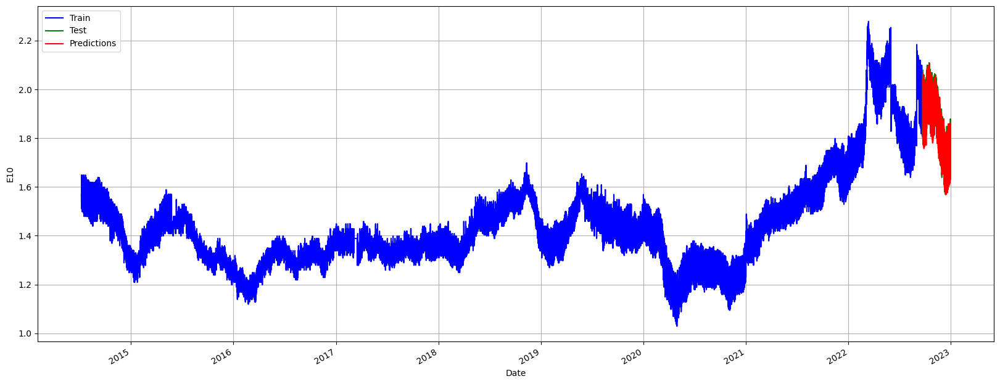

In [ ]:
# Plot E10 over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8


est_e10_df = pd.DataFrame({'est': est_scaled_e10,
                       'Date': test_e10['Date']})


ax = train_e10.plot(x='Date', y='E10', style='b-', grid=True)
ax = test_e10.plot(x='Date', y='E10', style='g-', grid=True, ax=ax)
ax = est_e10_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("E10")

Text(0.5, 1.0, 'Last 5 months prediction')

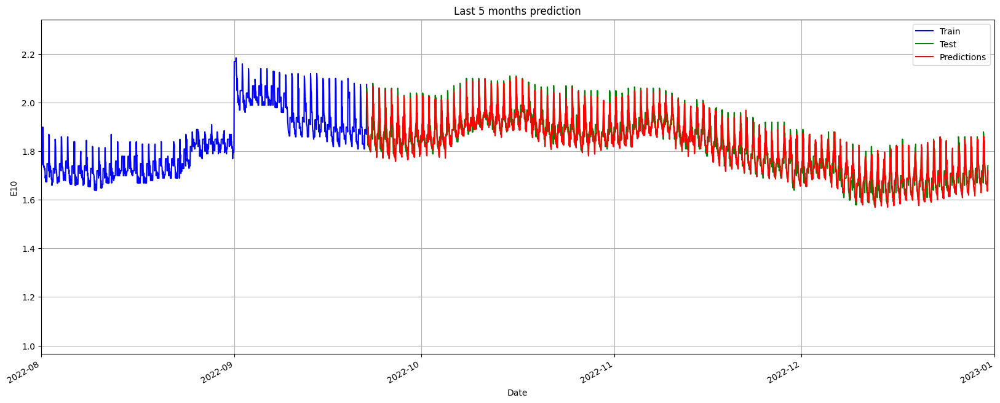

In [ ]:
# Plot E10 over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8


est_df = pd.DataFrame({'est': est_scaled_e10,
                       'Date': test_e10['Date']})


ax = train_e10.plot(x='Date', y='E10', style='b-', grid=True)
ax = test_e10.plot(x='Date', y='E10', style='g-', grid=True, ax=ax)
ax = est_e10_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("E10")
ax.set_xlim([date(2022, 8, 1), date(2023, 1, 1)])
ax.set_title("Last 5 months prediction")

Text(0.5, 1.0, 'Last 5 days prediction')

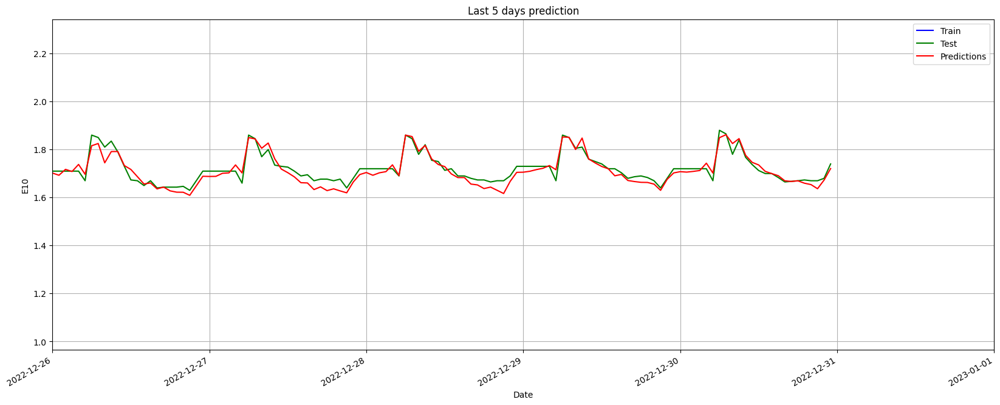

In [ ]:
# Plot E10 over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8


est_df = pd.DataFrame({'est': est_scaled_e10,
                       'Date': test_e10['Date']})


ax = train_e10.plot(x='Date', y='E10', style='b-', grid=True)
ax = test_e10.plot(x='Date', y='E10', style='g-', grid=True, ax=ax)
ax = est_e10_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("E10")
ax.set_xlim([date(2022, 12, 26), date(2023, 1, 1)])
ax.set_title("Last 5 days prediction")

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, median_absolute_error



# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test_e10, est_scaled_e10)
print(f"Mean Absolute Error (MAE): {mae}")


# Mean Squared Error (MSE)
mse = mean_squared_error(y_test_e10, est_scaled_e10)
print(f"Mean Squared Error (MSE): {mse}")


# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")


# Mean Absolute Percentage Error (MAPE)
y_true, y_pred = np.array(y_test_e10), np.array(est_scaled_e10)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
print(f"Mean Absolute Percentage Error (MAPE): {mape}")


# Coefficient of Determination (R-squared)
r_squared = r2_score(y_test_e10, est_scaled_e10)
print(f"Coefficient of Determination (R-squared): {r_squared}")


# Median Absolute Error (MedAE)
medae = median_absolute_error(y_test_e10, est_scaled_e10)
print(f"Median Absolute Error (MedAE): {medae}")

Mean Absolute Error (MAE): 0.02151201980316206
Mean Squared Error (MSE): 0.0008454957588830947
Root Mean Squared Error (RMSE): 0.0290774097691506
Mean Absolute Percentage Error (MAPE): 7.068806208615162
Coefficient of Determination (R-squared): 0.9328223203382588
Median Absolute Error (MedAE): 0.016605633735656822


##Diesel

In [ ]:
# Create the model
model_diesel = XGBRegressor(seed=model_seed,
                     n_estimators=n_estimators,
                     max_depth=max_depth,
                     learning_rate=learning_rate,
                     min_child_weight=min_child_weight,
                     subsample=subsample,
                     colsample_bytree=colsample_bytree,
                     colsample_bylevel=colsample_bylevel,
                     gamma=gamma)


# Train the regressor
model_diesel.fit(X_train_diesel_scaled, y_train_diesel)

XGBRegressor(base_score=None, booster=None, callbacks=None, colsample_bylevel=1,
             colsample_bynode=None, colsample_bytree=1, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
             max_leaves=None, min_child_weight=1, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [ ]:
# Do prediction on train set
est_scaled_diesel = model_diesel.predict(X_train_diesel_scaled)
#est = est_scaled * math.sqrt(scaler.var_[0]) + scaler.mean_[0]


# Calculate RMSE
print("RMSE on train set = %0.3f" % math.sqrt(mean_squared_error(y_train_diesel, est_scaled_diesel)))


# Calculate MAPE
#print("MAPE on train set = %0.3f%%" % get_mape(y_train, est_scaled))


RMSE on train set = 0.018


Text(0, 0.5, 'Diesel')

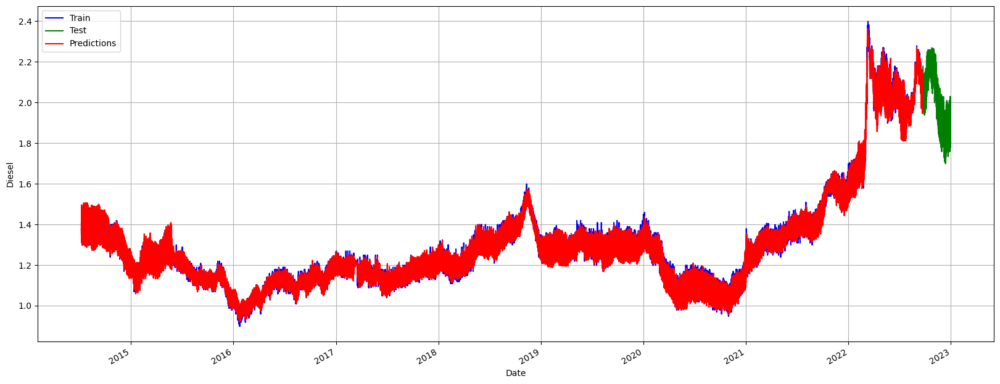

In [ ]:
# Plot Diesel over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8


est_diesel_df = pd.DataFrame({'est': est_scaled_diesel,
                       'Date': train_diesel['Date']})


ax = train_diesel.plot(x='Date', y='Diesel', style='b-', grid=True)
ax = test_diesel.plot(x='Date', y='Diesel', style='g-', grid=True, ax=ax)
ax = est_diesel_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("Diesel")

Text(0.5, 1.0, 'Random range of dates')

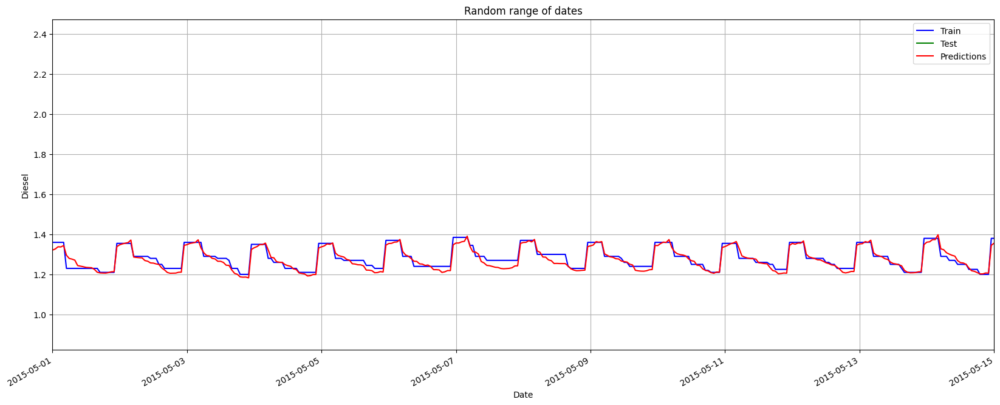

In [ ]:
ax = train_diesel.plot(x='Date', y='Diesel', style='b-', grid=True)
ax = test_diesel.plot(x='Date', y='Diesel', style='g-', grid=True, ax=ax)
ax = est_diesel_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("Diesel")
ax.set_xlim([date(2015, 5, 1), date(2015, 5, 15)])
ax.set_title("Random range of dates")

In [ ]:
# Do prediction on test set
est_scaled_diesel = model_diesel.predict(X_test_diesel_scaled)
#cv['est_scaled'] = est_scaled
#cv['est'] = cv['est_scaled'] * cv['diesel_std'] + cv['diesel_mean']


# Calculate RMSE
rmse_bef_tuning = math.sqrt(mean_squared_error(y_test_diesel, est_scaled_diesel))
print("RMSE on test set = %0.3f" % rmse_bef_tuning)


# Calculate MAPE
#mape_bef_tuning = get_mape(y_cv, cv['est'])
#print("MAPE on dev set = %0.3f%%" % mape_bef_tuning)


RMSE on test set = 0.035


Text(0, 0.5, 'Diesel')

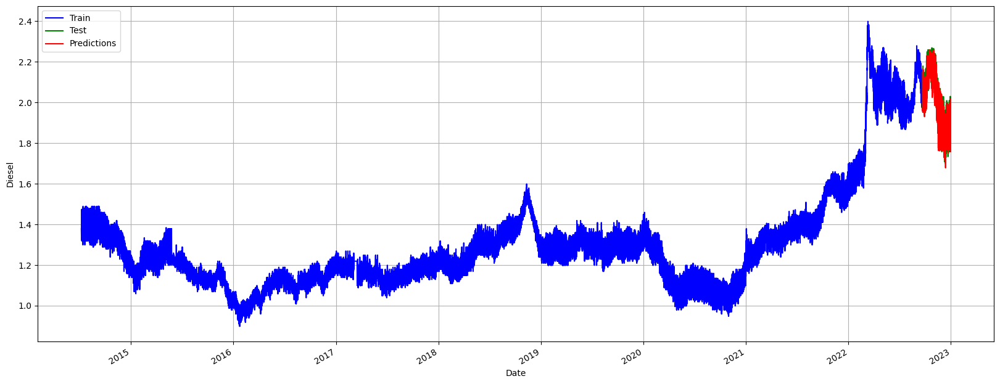

In [ ]:
# Plot Diesel over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8


est_diesel_df = pd.DataFrame({'est': est_scaled_diesel,
                       'Date': test_diesel['Date']})


ax = train_diesel.plot(x='Date', y='Diesel', style='b-', grid=True)
ax = test_diesel.plot(x='Date', y='Diesel', style='g-', grid=True, ax=ax)
ax = est_diesel_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("Diesel")

Text(0.5, 1.0, 'Last 5 months prediction')

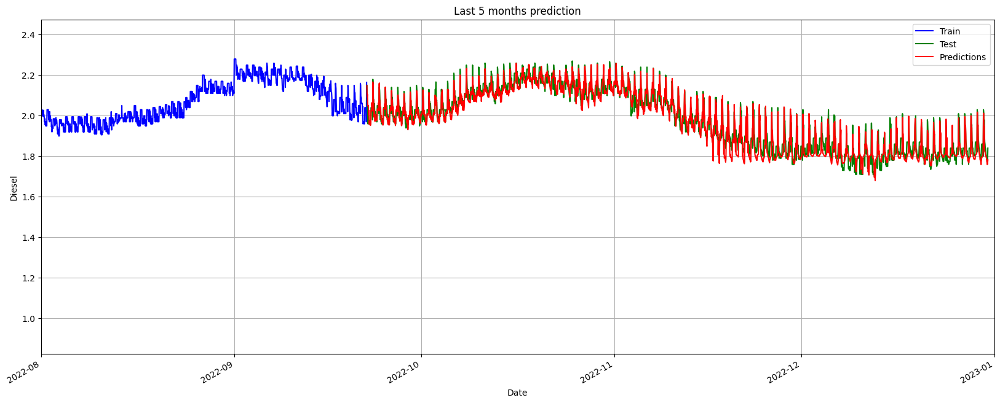

In [ ]:
# Plot Diesel over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8


est_df = pd.DataFrame({'est': est_scaled_diesel,
                       'Date': test_diesel['Date']})


ax = train_diesel.plot(x='Date', y='Diesel', style='b-', grid=True)
ax = test_diesel.plot(x='Date', y='Diesel', style='g-', grid=True, ax=ax)
ax = est_diesel_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("Diesel")
ax.set_xlim([date(2022, 8, 1), date(2023, 1, 1)])
ax.set_title("Last 5 months prediction")

Text(0.5, 1.0, 'Last 5 days prediction')

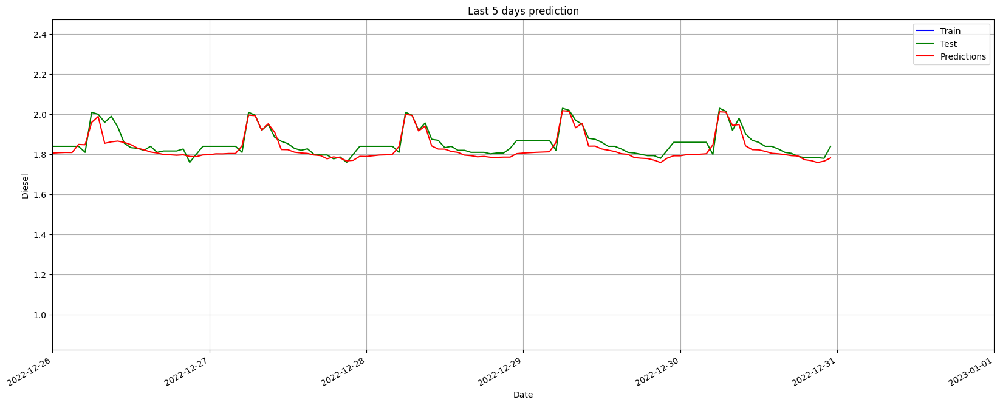

In [ ]:
# Plot Diesel over time
rcParams['figure.figsize'] = 20, 8 # width 20, height 8


est_df = pd.DataFrame({'est': est_scaled_diesel,
                       'Date': test_diesel['Date']})


ax = train_diesel.plot(x='Date', y='Diesel', style='b-', grid=True)
ax = test_diesel.plot(x='Date', y='Diesel', style='g-', grid=True, ax=ax)
ax = est_diesel_df.plot(x='Date', y='est', style='r-', grid=True, ax=ax)
ax.legend(['Train', 'Test', 'Predictions'])
ax.set_xlabel("Date")
ax.set_ylabel("Diesel")
ax.set_xlim([date(2022, 12, 26), date(2023, 1, 1)])
ax.set_title("Last 5 days prediction")

In [ ]:
from sklearn.metrics import mean_absolute_percentage_error

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, median_absolute_error


# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test_diesel, est_scaled_diesel)
print(f"Mean Absolute Error (MAE): {mae}")


# Mean Squared Error (MSE)
mse = mean_squared_error(y_test_diesel, est_scaled_diesel)
print(f"Mean Squared Error (MSE): {mse}")


# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")


# Mean Absolute Percentage Error (MAPE)
mape_function = mean_absolute_percentage_error(y_test_diesel,est_scaled_diesel)
#mape_function = mean_absolute_percentage_error(y_true,y_pred)

print(f"Mean Absolute Percentage Error (MAPE) (Function): {mape_function}")

y_true, y_pred = np.array(y_test_diesel), np.array(est_scaled_diesel)
mape_manual = (np.mean(np.abs((y_true - y_pred) / y_true))) * 100
#mape_manual = (np.mean(np.abs((y_test_diesel - est_scaled_diesel) / y_test_diesel))) * 100

print(f"Mean Absolute Percentage Error (MAPE) (Manual): {mape_manual}")


# Coefficient of Determination (R-squared)
r_squared = r2_score(y_test_diesel, est_scaled_diesel)
print(f"Coefficient of Determination (R-squared): {r_squared}")


# Median Absolute Error (MedAE)
medae = median_absolute_error(y_test_diesel, est_scaled_diesel)
print(f"Median Absolute Error (MedAE): {medae}")

Mean Absolute Error (MAE): 0.026574628800458765
Mean Squared Error (MSE): 0.001227237602115586
Root Mean Squared Error (RMSE): 0.035031951160556074
Mean Absolute Percentage Error (MAPE) (Function): 0.013633947682207092
Mean Absolute Percentage Error (MAPE) (Manual): 8.421317003910595
Coefficient of Determination (R-squared): 0.940158877873705
Median Absolute Error (MedAE): 0.020657428741455153
